In [317]:
from __future__ import division

import numpy as np
import os, sys
from PIL import Image
import pandas as pd
import json
import pickle

from matplotlib import pylab, mlab, pyplot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.path import Path
import matplotlib.patches as patches
%matplotlib inline

from IPython.core.pylabtools import figsize, getfigs

import seaborn as sns
from itertools import product
import random

from scipy.stats import norm
from IPython.display import clear_output

import copy
import importlib


### Add Paths

## root paths
curr_dir = os.getcwd()
proj_dir = os.path.abspath(os.path.join(curr_dir,'..')) ## use relative paths

## add helpers to python path
import sys
if os.path.join(proj_dir, 'stimuli') not in sys.path:
    sys.path.append(os.path.join(proj_dir, 'stimuli'))
    
## import utils from git submodule
sys.path.append("block_utils/")
import blockworld_utils as utils

from block_dict_to_input_program import convert


In [318]:
# set varaible for domino-style structures (two blocks, red and blue)
import domino_settings as dominoes

block_dims = dominoes.block_dims
block_colors = dominoes.brighter_block_colors
world_width = dominoes.world_width
world_height = dominoes.world_height
world_center = dominoes.world_center
black = ['#000000','#000000'] # used to display silhouettes
grey = ['#333333','#333333']

In [319]:
'''
#### Castle building functions ####

Functions that take a world object always return a world object.

These are designed with rejection sampling in mind.
If the function causes something bad to occur (e.g. breaks the tower that is being placed),
then world.broken is set to true.


'''

def new_world():
    return utils.World(block_dims = block_dims, 
                        block_colors = block_colors,
                        world_width = 20,
                        world_height = 20)


def stack(w, tower, n = 1, x_location = 0):
    '''
    Places n towers in the same xlocation.
    '''
    
    for i in range(0, n):
        w.place_tower(tower, x_location)

    return w


def row(w, tower, n = 1, diff = 0):
    '''
    Places tower n times in a row with diff squares between each one.
    '''
    
    for i in range(0, n):
        w.place_tower_relative(tower, direction='right', diff=diff)

    return w


def mirror(t):
    '''
    Mirror flips a tower dict/json (along vertical axis) and aligns to left.
    '''

    t2 = []
    for b in t:
        adjust = 1 if b['width'] == 1 else 0

        t2.append({
            'x': - b['x'] + 10 + adjust,
            'y': b['y'],
            'height': b['height'],
            'width': b['width'],
        })
        
    xs = [b['x'] for b in t2]
    min(xs)
    for b in t2:
        b['x'] = b['x'] - min(xs)

    return t2


def diag(w, tower, n = 1, direction = 'right'):
    
    if direction == 'right':
        for i in range(0, n):
            w.place_tower_relative(tower, direction='right', diff=-1)

        return w
    
    else:
        for i in range(0, n):
            t = utils.worldify(tower)
            w.place_tower_relative(tower, direction='left', diff=t.tower_width() - 1)

        return w
    
    
    
### Roof kinds
    
def pyramid(w, levels, tile = [{'x': 0, 
                                'y': 0, 
                                'height': 1, 
                                'width': 2}]):
    
    tile_world = utils.worldify(tile)
    
    
    cur_level = 0
    
    for i in range(0, levels):
        
#         n_blocks = levels-i
        
        start_location = 0 + i #hardcoded i for indiviudal blocks
        
        for j in range(0, levels-i):
            w.place_tower(tile, x_location = start_location + j*tile_world.tower_width())
            

    return w
    
    
def dome(w, levels, tile = [{'x': 0, 
                                'y': 0, 
                                'height': 1, 
                                'width': 2}]):
    
    tile_world = utils.worldify(tile)
    
    
    cur_level = 0
    
    for i in range(0, levels):
        
#         n_blocks = levels-i
        
        start_location = 0 + i #hardcoded i for indiviudal blocks

        if i == 0: # double up on first layer
            for j in range(0, levels-i-1):
                w.place_tower(tile, x_location = start_location -1 + (j+1)*tile_world.tower_width())

        for j in range(0, levels-i):
            w.place_tower(tile, x_location = start_location + j*tile_world.tower_width())
            

            

    return w
    
    
def slab(w, width, levels = 1, tile = [{'x': 0, 
                                'y': 0, 
                                'height': 2, 
                                'width': 1}]):
    
    tile_world = utils.worldify(tile)
    
    for lev in range(0, levels):

        for i in range(0, width):

            w.place_tower(tile, x_location = i*tile_world.tower_width())
            

    return w


def vertical_brick_layer(w, width, x_location = 0, levels = 1, tile = [{'x': 0, 
                                'y': 0, 
                                'height': 2, 
                                'width': 1}]):
    
    tile_world = utils.worldify(tile)
    
    for lev in range(0, levels):

        for i in range(0, width):

            w.place_tower(tile, x_location = x_location + i*tile_world.tower_width())
            

    return w



def castillate(w, width, gap=2, x_location = 0, tile = [{'x': 0, 
                                'y': 0, 
                                'height': 2, 
                                'width': 1}]):
    
    tile_world = utils.worldify(tile)
    

    for i in range(0, width):
        
        if i%gap==0:
            w.place_tower(tile, x_location = x_location + i*tile_world.tower_width())
            

    return w

def symmetrical_castillate(w, gap=2):
    
    castillate(w, width=int(w.tower_width()/2), gap=gap)
    
    castillate(w, width=int(w.tower_width()/2), gap=gap, x_location=int(w.tower_width()/2)+1)


def horizontal_brick_layer(w, width, x_location = 0, levels = 1, tile = [{'x': 0, 
                                'y': 0, 
                                'height': 1, 
                                'width': 2}]):
    
    tile_world = utils.worldify(tile)
    
    for lev in range(0, levels):

        for i in range(0, int(width/2)):

            w.place_tower(tile, x_location = x_location + i*tile_world.tower_width())
            

    return w


def vertical_line(w, height, x_location = 0, tile = [{'x': 0, 
                                'y': 0, 
                                'height': 2, 
                                'width': 1}]):
    
    tile_world = utils.worldify(tile)
    
    for brick in range(0, int(height/2)):
        w.place_tower(tile, x_location = x_location)
            

    return w

def viaduct(w):
    horizontal_brick_layer(w, w.tower_width())

# Enumeration

In [320]:
# hardcoded components

# Generic

HORIZONTAL = [{'x': 0, 'y': 0, 'height': 1, 'width': 2}]

VERTICAL = [{'x': 0, 'y': 0, 'height': 2, 'width': 1}]

ARCH = [{'x': 0, 'y': 0, 'height': 2, 'width': 1},
        {'x': 0, 'y': 2, 'height': 1, 'width': 2},
        {'x': 3, 'y': 0, 'height': 2, 'width': 1},
        {'x': 2, 'y': 2, 'height': 1, 'width': 2},]

# Houses

SMALL_WINDOW = [{'x': 0, 'y': 0, 'height': 1, 'width': 2}, 
          {'x': 2, 'y': 0, 'height': 1, 'width': 2}, 
          {'x': 0, 'y': 1, 'height': 2, 'width': 1}, 
          {'x': 3, 'y': 1, 'height': 2, 'width': 1}, 
          {'x': 0, 'y': 3, 'height': 1, 'width': 2}, 
          {'x': 2, 'y': 3, 'height': 1, 'width': 2}]

BIG_WINDOW = [{'x': 0, 'y': 0, 'height': 1, 'width': 2},
               {'x': 2, 'y': 0, 'height': 1, 'width': 2},
               {'x': 0, 'y': 1, 'height': 2, 'width': 1},
               {'x': 0, 'y': 3, 'height': 2, 'width': 1},
               {'x': 3, 'y': 1, 'height': 2, 'width': 1},
               {'x': 3, 'y': 3, 'height': 2, 'width': 1},
               {'x': 0, 'y': 5, 'height': 1, 'width': 2},
               {'x': 2, 'y': 5, 'height': 1, 'width': 2}]

DOOR = [{'x': 0, 'y': 0, 'height': 2, 'width': 1},
        {'x': 0, 'y': 2, 'height': 2, 'width': 1}, 
        {'x': 3, 'y': 0, 'height': 2, 'width': 1}, 
        {'x': 3, 'y': 2, 'height': 2, 'width': 1}]

HOUSE_BRICKS = [{'x': 0, 'y': 0, 'height': 1, 'width': 2}, 
          {'x': 2, 'y': 0, 'height': 1, 'width': 2}, 
          {'x': 0, 'y': 1, 'height': 2, 'width': 1}, 
          {'x': 3, 'y': 1, 'height': 2, 'width': 1}, 
          {'x': 1, 'y': 1, 'height': 1, 'width': 2}, 
          {'x': 1, 'y': 2, 'height': 1, 'width': 2}, 
          {'x': 0, 'y': 3, 'height': 1, 'width': 2}, 
          {'x': 2, 'y': 3, 'height': 1, 'width': 2}]



# Bridges
ARCH_W4 = [{'x': 0, 'y': 0, 'height': 2, 'width': 1}, 
           {'x': 3, 'y': 0, 'height': 2, 'width': 1}, 
           {'x': 0, 'y': 2, 'height': 1, 'width': 2}, 
           {'x': 2, 'y': 2, 'height': 1, 'width': 2}]

ARCH_W6 = [{'x': 0, 'y': 0, 'height': 1, 'width': 2},
           {'x': 1, 'y': 1, 'height': 1, 'width': 2}, 
           {'x': 4, 'y': 0, 'height': 1, 'width': 2}, 
           {'x': 3, 'y': 1, 'height': 1, 'width': 2}, 
           {'x': 0, 'y': 2, 'height': 1, 'width': 2}, 
           {'x': 2, 'y': 2, 'height': 1, 'width': 2}, 
           {'x': 4, 'y': 2, 'height': 1, 'width': 2}]

ARCH_W8 = [{'x': 0, 'y': 0, 'height': 1, 'width': 2}, 
           {'x': 6, 'y': 0, 'height': 1, 'width': 2},
           {'x': 1, 'y': 1, 'height': 1, 'width': 2}, 
           {'x': 5, 'y': 1, 'height': 1, 'width': 2}, 
           {'x': 2, 'y': 2, 'height': 1, 'width': 2}, 
           {'x': 4, 'y': 2, 'height': 1, 'width': 2}, 
           {'x': 0, 'y': 2, 'height': 1, 'width': 2}, 
           {'x': 6, 'y': 2, 'height': 1, 'width': 2}]

ARCHES_EQUAL_HEIGHTS = {4: ARCH_W4,
                        6: ARCH_W6, 
                        8: ARCH_W8}

# Bricks/tiles for walls, towers, and turrets

MANUAL_BRICK_SQUARE = [{'x': 0, 'y': 0, 'height': 1, 'width': 2}, 
                       {'x': 2, 'y': 0, 'height': 2, 'width': 1}, 
                       {'x': 0, 'y': 1, 'height': 2, 'width': 1}, 
                       {'x': 1, 'y': 2, 'height': 1, 'width': 2}]

MANUAL_BRICK_BIRD = [{'x': 1, 'y': 0, 'height': 2, 'width': 1}, 
                     {'x': 2, 'y': 0, 'height': 1, 'width': 2}, 
                     {'x': 2, 'y': 1, 'height': 2, 'width': 1}, 
                     {'x': 0, 'y': 2, 'height': 1, 'width': 2}]

MANUAL_BRICK_ARCH = [{'x': 0, 'y': 0, 'height': 2, 'width': 1}, 
                     {'x': 3, 'y': 0, 'height': 2, 'width': 1}, 
                     {'x': 0, 'y': 2, 'height': 1, 'width': 2}, 
                     {'x': 2, 'y': 2, 'height': 1, 'width': 2}]

MANUAL_BRICK_TSHIRT = [{'x': 1, 'y': 0, 'height': 2, 'width': 1}, 
                       {'x': 2, 'y': 0, 'height': 2, 'width': 1}, 
                       {'x': 0, 'y': 2, 'height': 1, 'width': 2}, 
                       {'x': 2, 'y': 2, 'height': 1, 'width': 2}] 

MANUAL_BRICK_SWAN = [{'x': 0, 'y': 0, 'height': 1, 'width': 2}, 
                     {'x': 2, 'y': 0, 'height': 2, 'width': 1}, 
                     {'x': 0, 'y': 1, 'height': 2, 'width': 1}, 
                     {'x': 2, 'y': 2, 'height': 1, 'width': 2}]

MANUAL_BRICK_PEGODA = [{'x': 1, 'y': 0, 'height': 1, 'width': 2}, 
                       {'x': 0, 'y': 1, 'height': 1, 'width': 2}, 
                       {'x': 2, 'y': 1, 'height': 1, 'width': 2}]

MANUAL_BRICK_BRICKS = [{'x': 0, 'y': 0, 'height': 1, 'width': 2}, 
                       {'x': 1, 'y': 1, 'height': 2, 'width': 1}, 
                       {'x': 0, 'y': 1, 'height': 2, 'width': 1}, 
                       {'x': 3, 'y': 0, 'height': 2, 'width': 1}, 
                       {'x': 2, 'y': 0, 'height': 2, 'width': 1}, 
                       {'x': 2, 'y': 2, 'height': 1, 'width': 2}]

MANUAL_BRICK_CHECKED = [{'x': 0, 'y': 0, 'height': 1, 'width': 2}, 
                        {'x': 0, 'y': 1, 'height': 1, 'width': 2}, 
                        {'x': 1, 'y': 2, 'height': 2, 'width': 1}, 
                        {'x': 0, 'y': 2, 'height': 2, 'width': 1}, 
                        {'x': 3, 'y': 0, 'height': 2, 'width': 1}, 
                        {'x': 2, 'y': 0, 'height': 2, 'width': 1}, 
                        {'x': 2, 'y': 2, 'height': 1, 'width': 2}, 
                        {'x': 2, 'y': 3, 'height': 1, 'width': 2}]

tower_bricks_manual = [MANUAL_BRICK_SQUARE,
                      MANUAL_BRICK_BIRD,
                      MANUAL_BRICK_ARCH,
                      MANUAL_BRICK_TSHIRT,
                      MANUAL_BRICK_SWAN,
                      MANUAL_BRICK_PEGODA,
                      MANUAL_BRICK_BRICKS,
                      MANUAL_BRICK_CHECKED,
                      SMALL_WINDOW,
                      BIG_WINDOW]

In [321]:
# Pre-build roofs

pyramids = {}

for roof_size in range(1,20):
    
    r = new_world()
    pyramid(r, int(roof_size/2))
    roof_dict = r.get_block_dict()['blocks']
    
    if (r.broken):
        print('BAD ROOF- RESIZE WORLD?')
        #utils.draw_world(wall)
    else:
        pyramids[roof_size] = roof_dict

        
domes = {}

for roof_size in range(1,20):
    
    r = new_world()
    dome(r, int(roof_size/2))
    roof_dict = r.get_block_dict()['blocks']
    
    if (r.broken):
        print('BAD ROOF- RESIZE WORLD?')
    else:
        domes[roof_size] = roof_dict
#         utils.draw_world(d)


slabs = {}

for width in range(1,20):
    
    r = new_world()
    slab(r, width)
    row_dict = r.get_block_dict()['blocks']
    
    if (r.broken):
        print('BAD ROOF- RESIZE WORLD?')
        #utils.draw_world(wall)
    else:
        slabs[width] = row_dict
      
    
flats = {}   

for width in range(1,20):
    
    r = new_world()
    horizontal_brick_layer(r, int(roof_size/2))
    row_dict = r.get_block_dict()['blocks']
    
    if (r.broken):
        print('BAD ROOF- RESIZE WORLD?')
        #utils.draw_world(wall)
    else:
        flats[width] = row_dict

In [322]:
RANDOM_SEED = 0

## Enumerate Skyscrapers

#### Individual skyscrapers

In [323]:
random.seed(RANDOM_SEED)

In [18]:
MAX_SKYSCRAPER_HEIGHT = 4
MIN_SKYSCRAPER_HEIGHT = 1

SKYSCRAPER_ROOFS = {'pyramids': pyramids,
#                     'slabs': slabs, # not used for cogsci22
                    'flats': flats}

REPEAT_OPTIONS = ['mirrored', 'repeated', 'single']

In [80]:
skyscrapers = []
df_skyscrapers = pd.DataFrame()

for skyscraper_1_height in range(MIN_SKYSCRAPER_HEIGHT, MAX_SKYSCRAPER_HEIGHT+1):
    for t_1_brick in tower_bricks_manual:

        t_1_brick_width = utils.worldify(t_1_brick).tower_width()

        for repeat_option in REPEAT_OPTIONS:

            for _, (roof_1_name, roof_1_type) in enumerate(SKYSCRAPER_ROOFS.items()):

                w = new_world()

                # vertically stack bricks for tower one
                stack(w, t_1_brick, n=skyscraper_1_height, x_location=0)

                if repeat_option == 'mirrored':
                    # repeat but mirrored
                    stack(w, mirror(t_1_brick), n=skyscraper_1_height, x_location=t_1_brick_width)
                    # add roof
                    if roof_1_name != 'none':
                        wall_width = roof_1_type[t_1_brick_width*2]
                        w.place_tower(wall_width, 0)

                elif repeat_option == 'repeated':
                    # repeat
                    stack(w, t_1_brick, n=skyscraper_1_height, x_location=t_1_brick_width)

                    # add roof
                    if roof_1_name != 'none':
                        wall_width = roof_1_type[t_1_brick_width*2]
                        w.place_tower(wall_width, 0)

                elif repeat_option == 'single':

                    # add roof
                    if roof_1_name != 'none':
                        wall_width = roof_1_type[t_1_brick_width]
                        w.place_tower(wall_width, 0)

                else:
                    raise Exception("No such mirror option (\"{}\") supported".format(repeat_option))


                if not w.broken:
                    skyscrapers.append(w)
                    df_skyscrapers = df_skyscrapers.append(
                        {
                            'structure_type': 'skyscraper',
                            'blocks': w.get_block_dict()['blocks'],
                            'structure_width': w.tower_width(),
                            'structure_height': w.tower_height(),
                            'n_blocks': len(w.blocks),
                            'brick': t_1_brick,
                            'roof_name': roof_1_name,
                            'skyscraper_height':skyscraper_1_height,
                            'roof_size': wall_width,
                            'repeat_option': repeat_option
                        }, ignore_index=True
                    )

print(str(len(skyscrapers)) + ' individual skyscrapers generated')


185 individual skyscrapers generated


Pairs of skyscrapers

In [81]:
MIN_SKYSCRAPER_GAP = 1
MAX_SKYSCRAPER_GAP = 2

In [82]:
cities = []
df_cities = pd.DataFrame()

for i, s1 in df_skyscrapers.iterrows():
    for j, s2 in df_skyscrapers.iterrows():
        for gap in range(MIN_SKYSCRAPER_GAP, MAX_SKYSCRAPER_GAP+1):
            
            w = new_world()
            w = w.place_tower(s1.blocks, 0)
            w.place_tower(s2.blocks, x_location = int(s1.structure_width+gap))
            
            if not w.broken:
                cities.append(w)
                df_cities = df_cities.append(
                    {
                        'structure_type': 'city',
                        'blocks': w.get_block_dict()['blocks'],
                        'structure_width': w.tower_width(),
                        'structure_height': w.tower_height(),
                        'n_blocks': len(w.blocks),
                        't_1_brick': s1.brick,
                        't_2_brick': s2.brick,
                        'gap': gap,
                        'roof_1_name': s1.roof_name,
                        'roof_2_name': s2.roof_name,
                        'skyscraper_1_height': s1.skyscraper_height,
                        'skyscraper_2_height': s2.skyscraper_height,
                    }, ignore_index=True
                )

print(str(len(cities)) + ' pairs of skyscrapers generated')

68450 pairs of skyscrapers generated


In [164]:
# df_subsets['city'].to_csv('df_cities_topdown_abstractions.csv')

## Enumerate Houses

In [83]:
random.seed(RANDOM_SEED)

In [84]:
HOUSE_WIDTHS = [1,2,3]
HOUSE_HEIGHTS = [1,2,3]

TILE_WIDTH = 4
TILE_HEIGHT = 4

MIN_DOOR = 0
MAX_DOOR = 2

HOUSE_ROOFS = {'pyramids': pyramids}

FIRST_STORY_COMPONENTS = [DOOR,
                            SMALL_WINDOW,
                            HOUSE_BRICKS]

OTHER_STORY_COMPONENTS = [SMALL_WINDOW,
                            HOUSE_BRICKS]

In [85]:
# get all permutations of components

# ground floors can include doors
first_stories = {}
for house_width in HOUSE_WIDTHS:
    repeated_components = [FIRST_STORY_COMPONENTS] * house_width
    first_stories[house_width] = list(product(*repeated_components))


# non-ground floors don't included doors
other_stories = {}
for house_width in HOUSE_WIDTHS:
    repeated_components = [OTHER_STORY_COMPONENTS] * house_width
    other_stories[house_width] = list(product(*repeated_components))

In [86]:
def floor_tuple_to_floor_world(tiles):
    '''
    Helper function to convert json to world object
    '''
    w = new_world()
    for i, tile in enumerate(tiles):
        w.place_tower_relative(tile)
        
    return w

In [87]:
houses = []
df_houses = pd.DataFrame()

generation_probability = 1.0

for house_width in HOUSE_WIDTHS:
    
#     structure_generation_probability = generation_probability * (0.8 ** float(house_width))
    
    first_story_worlds = [floor_tuple_to_floor_world(blocks) for blocks in first_stories[house_width]]
    other_story_worlds = [floor_tuple_to_floor_world(blocks) for blocks in other_stories[house_width]]
    
    for _, (roof_name, roof_type) in enumerate(HOUSE_ROOFS.items()):

        # one story
        for s_1 in first_story_worlds:
            
            structure_generation_probability = generation_probability * 0.9 ** (house_width)

            w = new_world()
            w.place_tower(s_1.get_block_dict()['blocks'])
            w.place_tower(roof_type[house_width*4])

            if (not(w.broken)) & (random.uniform(0, 1) < structure_generation_probability):
                    houses.append(w)
                    df_houses = df_houses.append(
                        {
                            'structure_type': 'house',
                            'blocks': w.get_block_dict()['blocks'],
                            'structure_width': w.tower_width(),
                            'structure_height': w.tower_height(),
                            'n_blocks': len(w.blocks),
                            'house_width': house_width,
                            'n_stories': 1,
                            'roof_name': roof_name
                        }, ignore_index=True
                        )

        # two story
        for s_1 in first_story_worlds:
            for s_2 in other_story_worlds:
                
                structure_generation_probability = generation_probability * 0.9 ** (2 ** house_width)

                w = new_world()
                w.place_tower(s_1.get_block_dict()['blocks'])
                w.place_tower(s_2.get_block_dict()['blocks'])
                w.place_tower(roof_type[house_width*4])

                if (not(w.broken)) & (random.uniform(0, 1) < structure_generation_probability):
                    houses.append(w)
                    df_houses = df_houses.append(
                        {
                            'structure_type': 'house',
                            'blocks': w.get_block_dict()['blocks'],
                            'structure_width': w.tower_width(),
                            'structure_height': w.tower_height(),
                            'n_blocks': len(w.blocks),
                            'house_width': house_width,
                            'n_stories': 2,
                            'roof_name': roof_name
                        }, ignore_index=True
                    )
    
        # two story
        for s_1 in first_story_worlds:
            for s_2 in other_story_worlds:
                for s_3 in other_story_worlds:
                    
                    structure_generation_probability = generation_probability * 0.9 ** (3 ** house_width)

                    w = new_world()
                    w.place_tower(s_1.get_block_dict()['blocks'])
                    w.place_tower(s_2.get_block_dict()['blocks'])
                    w.place_tower(s_3.get_block_dict()['blocks'])
                    w.place_tower(roof_type[house_width*4])

                    if (not(w.broken)) & (random.uniform(0, 1) < structure_generation_probability):
                        houses.append(w)
                        df_houses = df_houses.append(
                        {
                            'structure_type': 'house',
                            'blocks': w.get_block_dict()['blocks'],
                            'structure_width': w.tower_width(),
                            'structure_height': w.tower_height(),
                            'n_blocks': len(w.blocks),
                            'house_width': house_width,
                            'n_stories': 3,
                            'roof_name': roof_name
                        }, ignore_index=True
                        )
                        
print(str(len(houses)) + ' houses generated')

333 houses generated


## Enumerate Castles

- Bilateral symmetry
- Central wall constructed from one repeated 4-block motif (mirrored)
- Turrets constructed from one repeated 4-block motif (mirrored either side)
- Same style roof on turrets and center

In [88]:
random.seed(RANDOM_SEED)

In [89]:
MIN_CASTLE_WALL_HEIGHT = 1
MAX_CASTLE_WALL_HEIGHT = 4
CASTLE_WALL_SIZES = [2,4]


MIN_CASTLE_TOWER_HEIGHT = 1
MAX_CASTLE_TOWER_HEIGHT = 4

CASTLE_ROOFS = {'pyramid': pyramids,
         'dome': domes}

In [90]:
castles = []
df_castles = pd.DataFrame()

for wall_height in range(MIN_CASTLE_WALL_HEIGHT, MAX_CASTLE_WALL_HEIGHT + 1):
    
    # outer towers must be shorter 
    for tower_height in range(MIN_CASTLE_TOWER_HEIGHT, MAX_CASTLE_TOWER_HEIGHT + 1):
        
        for wall_size in CASTLE_WALL_SIZES:
            
             for wall_brick in tower_bricks_manual:
                    
                    for tower_brick in tower_bricks_manual:
                        
                        for _, (roof_name, roof_type) in enumerate(CASTLE_ROOFS.items()):
                            
                            structure_generation_probability = 1.0

                            w = new_world() #castle object

                            #tower world object
                            tower_w = new_world()
                            tower_w = stack(tower_w, tower_brick, tower_height)
                            tower_width = tower_w.tower_width()
                            tower = tower_w.get_block_dict()['blocks']

                            #wall world object
                            wall_column_w = new_world()
                            wall_column_w = stack(wall_column_w, wall_brick, wall_height)
                            wall_column_width = wall_column_w.tower_width()
                            wall_column = wall_column_w.get_block_dict()['blocks']

                            # place left tower
                            w.place_tower_relative(tower)

                            # add roof to left tower
                            if tower_width >= 4:
                                w.place_tower(roof_type[tower_width])

                            # construct wall
                            for i in range(0,int(wall_size/2)):
                                w.place_tower_relative(wall_column)

                            for i in range(0,int(wall_size/2)):
                                w.place_tower_relative(mirror(wall_column))

                            wall_width = wall_column_width*wall_size

                            # add roof to wall
                            w.place_tower(roof_type[wall_width], tower_width)

                            # place right tower
                            w.place_tower_relative(mirror(tower))

                            # add roof to right tower
                            if tower_width >= 4:
                                w.place_tower(roof_type[tower_width], 
                                              tower_width + wall_width)
                                
                                
                            # avoid particularly evocative towers
                            if (w.tower_height() > 13) and (tower_height < 3) and \
                            ((roof_name=='dome') or ((roof_name=='none') and (tower_width==3))):
                                structure_generation_probability = 0.0
                            

                            if (not(w.broken)) & (random.uniform(0,1) < structure_generation_probability):
                                castles.append(w)
                                df_castles = df_castles.append(
                                    {
                                        'structure_type': 'castle',
                                        'blocks': w.get_block_dict()['blocks'],
                                        'structure_width': w.tower_width(),
                                        'structure_height': w.tower_height(),
                                        'n_blocks': len(w.blocks),
                                        'wall_height': wall_height,
                                        'wall_size': wall_size,
                                        'wall_brick': wall_brick,
                                        'tower_brick': tower_brick,
                                        'tower_height': tower_height,
                                        'roof_name': roof_name,
                                        'central_roof_size': wall_width,
                                        'tower_roof_size': tower_width,
                                    }, ignore_index=True
                                )
    #                             fig = utils.draw_world(w)
    #                             n_towers += 1

print(str(len(castles)) + ' castles generated')

2778 castles generated


## Enumerate Bridges

In [91]:
random.seed(RANDOM_SEED) # unused in bridges right now 

In [92]:
MIN_N_ARCHES = 1
MAX_N_ARCHES = 5
MAX_BRIDGE_ELEVATION = 5

INNER_ARCH_WIDTHS = [4, 6, 8]
OUTER_ARCH_WIDTHS = [0, 4, 6, 8]

MIN_BRIDGE_THICKNESS = 0
MAX_BRIDGE_THICKNESS = 2

PILLAR_TYPES = ['none','uniform','high_middle','high_ends']

In [93]:
bridges = []
df_bridges = pd.DataFrame()

for n_inner_arch in range(MIN_N_ARCHES, MAX_N_ARCHES+1):

    for bridge_elevation in range(1, MAX_BRIDGE_ELEVATION):

        for inner_width in INNER_ARCH_WIDTHS:

            for outer_width in OUTER_ARCH_WIDTHS:
                
                for pillar_type in PILLAR_TYPES:
                    
                    for bridge_thickness in range(MIN_BRIDGE_THICKNESS, MAX_BRIDGE_THICKNESS+1):

                        if outer_width == inner_width:
                            continue

                        w = new_world()

                        # create outer arches
                        if outer_width != 0:
                            outer_arch = ARCHES_EQUAL_HEIGHTS[outer_width]
                            outer_arch_world = new_world()
                            outer_arch_world.place_tower(outer_arch)


                        # create inner arches
                        inner_arch = ARCHES_EQUAL_HEIGHTS[inner_width]
                        inner_arch_world = new_world()
                        inner_arch_world.place_tower(inner_arch)


                        if outer_width != 0:
                            # place blocks under left outer arch
                            for j in range(0, bridge_elevation):
                                w.place_tower(VERTICAL, 
                                              x_location=0)
                                w.place_tower(VERTICAL, 
                                              x_location=outer_width-1)
                            # place left outer arch
                            w.place_tower(outer_arch)


                        for i in range(0,n_inner_arch):
                            # place blocks under inner arches
                            for j in range(0, bridge_elevation):
                                w.place_tower(VERTICAL, 
                                              x_location=outer_width+(i*inner_width))
                                w.place_tower(VERTICAL, 
                                              x_location=outer_width+((i+1)*inner_width)-1)
                            # place inner arche
                            w.place_tower(inner_arch,
                                          x_location=outer_width+i*inner_width)

                        if outer_width != 0:
                            # place blocks under right outer arch
                            for j in range(0, bridge_elevation):
                                w.place_tower(VERTICAL, 
                                              x_location=outer_width+(n_inner_arch*inner_width))
                                w.place_tower(VERTICAL, 
                                              x_location=outer_width+(n_inner_arch*inner_width)+outer_width-1)
                            # place right outer arch
                            w.place_tower(outer_arch,
                                          x_location=outer_width+(n_inner_arch*inner_width))


                        # Add layer of blue    
                        for i in range(0, bridge_thickness):
                            if i%2 == 0:
                                horizontal_brick_layer(w, w.tower_width()-2, x_location = 1)
                            else:
                                horizontal_brick_layer(w, w.tower_width(), x_location = 0)
                            
                            
                        # find where to place suspension pillars
                        if pillar_type != 'none':
                            arch_widths = []

                            if outer_width > 0:
                                arch_widths.append(outer_width)

                            for i in range(0, n_inner_arch):
                                arch_widths.append(inner_width)

                            if outer_width > 0:
                                arch_widths.append(outer_width)

                            arch_widths

                            pillar_locations = []

                            for arch_width in arch_widths:

                                if pillar_locations == []:
                                    pillar_locations.append(0)
                                    pillar_locations.append(arch_width-1)
                                else:
                                    pillar_locations.append(pillar_locations[-1]+1)
                                    pillar_locations.append(pillar_locations[-1]+arch_width-1)


                            if pillar_type == 'uniform':
                                for x_location in pillar_locations:
                                    w.place_tower(VERTICAL, 
                                                  x_location=x_location)

                            elif (pillar_type == 'high_middle'):
                                
                                if (len(pillar_locations) <= 2):
                                    continue
                                else:

                                    while len(pillar_locations)>=2:
                                        for x_location in pillar_locations:
                                            w.place_tower(VERTICAL, 
                                                          x_location=x_location)

                                        pillar_locations = pillar_locations[1:-1]

                            elif pillar_type == 'high_ends':
                                
                                if (len(pillar_locations) <= 2):
                                    continue
                                    
                                else:

                                    while len(pillar_locations)>=2:
                                        for x_location in pillar_locations:
                                            w.place_tower(VERTICAL, 
                                                          x_location=x_location)

                                        pillar_locations = pillar_locations[0:int(len(pillar_locations)/2)-1] + pillar_locations[int(len(pillar_locations)/2)+1:]


                        if not(w.broken):
                                bridges.append(w)
                                df_bridges = df_bridges.append(
                                    {
                                        'structure_type': 'bridge',
                                        'blocks': w.get_block_dict()['blocks'],
                                        'structure_width': w.tower_width(),
                                        'structure_height': w.tower_height(),
                                        'bridge_elevation': bridge_elevation,
                                        'n_blocks': len(w.blocks),
                                        'n_inner_arch': n_inner_arch,
                                        'pillar_type': pillar_type,
                                        'inner_width': inner_width,
                                        'outer_width': outer_width,
                                        'includes_outer_arches': outer_width != 0
                                    }, ignore_index=True
                                )

print(str(len(bridges)) + ' bridges generated')

744 bridges generated


## Separate dataframes for each structure

In [94]:
subdomains = ['bridge', 'house', 'castle', 'city']

full_dfs = {
    'bridge': df_bridges,
    'house': df_houses,
    'castle': df_castles,
    'city': df_cities
}

In [95]:
orders = {
    'bridge': ['includes_outer_arches', 'n_inner_arch', 'bridge_elevation', 'inner_width', 'structure_height'],
    'house': ['n_stories','house_width'],
    'castle': ['wall_height','wall_size','tower_height','roof_name'],
    'city': ['skyscraper_1_height', 'skyscraper_2_height', 'structure_height','gap']
}

#### subset 250 structure, order by quasi-complexity, assign to test or train

In [96]:
df_subsets = {}

for subdomain in subdomains:
    
    df_full = full_dfs[subdomain].copy()
    
    # add dreamcoder programs
    df_full['dreamcoder_program'] = df_full['blocks'].apply(lambda x: convert(x, whole_squares=False))
    df_full['program_whole_squares'] = \
            df_full['blocks'].apply(lambda x: convert(x, whole_squares=True))
    
    
    # sample
    df_subset = df_full.sample(frac=1, random_state=RANDOM_SEED)\
                                .head(250)


    # sort
    df_subset = df_subset.sort_values(orders[subdomain]).reset_index(drop=True)

    df_subset['structure_number'] = df_subset.index
    
    # test-train split

    train = df_subset.sample(frac=0.8, random_state=RANDOM_SEED) #random state is a seed value
    test = df_subset.drop(train.index)

    df_subset.loc[train.index,'train'] = True
    df_subset.loc[test.index,'train'] = False
    
    df_subsets[subdomain] = df_subset

### Export each domain for upload to S3

In [99]:
# export to inidividual jsons

for subdomain in subdomains:

    filepath ='./lax-structures-{}-all/'.format(subdomain)

    if not os.path.exists(filepath):
            os.makedirs(filepath)

    for i in df_subsets[subdomain].index:
#         df_subsets[subdomain].loc[i].to_json("./{}/lax-structures-{}-{}-{}.json".format(filepath, 
#                                                    df_subsets[subdomain].loc[i,'structure_type'],
#                                                    str(df_subsets[subdomain].loc[i,'structure_number']).zfill(3),
#                                                    'train' if df_subsets[subdomain].loc[i,'train'] else 'test'))
        df_subsets[subdomain].loc[i].to_json("./{}/lax-structures-{}-{}-all.json".format(filepath, 
                                                   df_subsets[subdomain].loc[i,'structure_type'],
                                                   str(df_subsets[subdomain].loc[i,'structure_number']).zfill(3)))


    df_subsets[subdomain].to_csv(filepath + 'df_{}.csv'.format(subdomain))

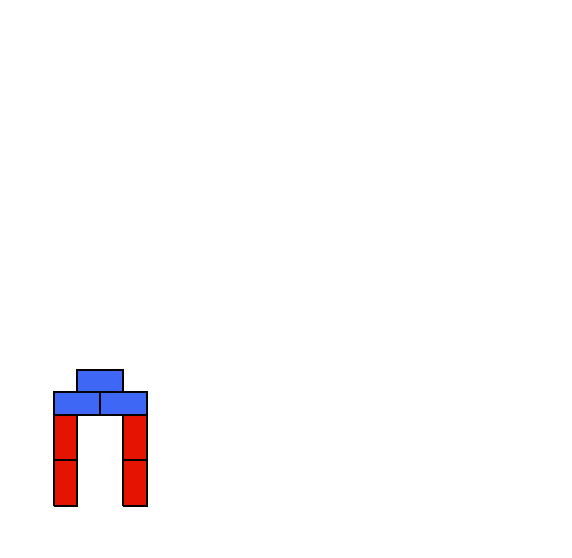

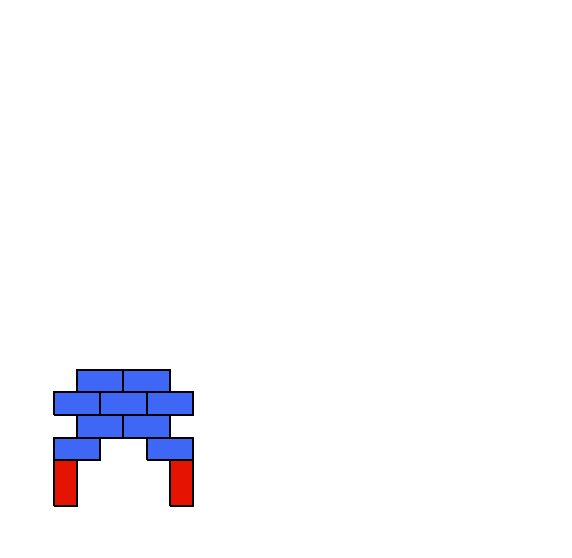

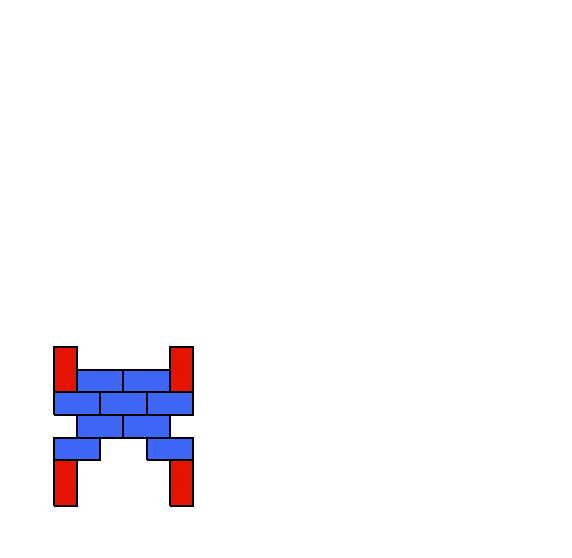

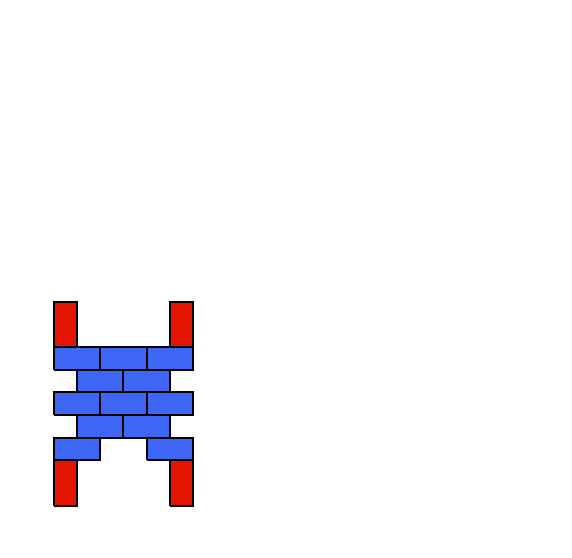

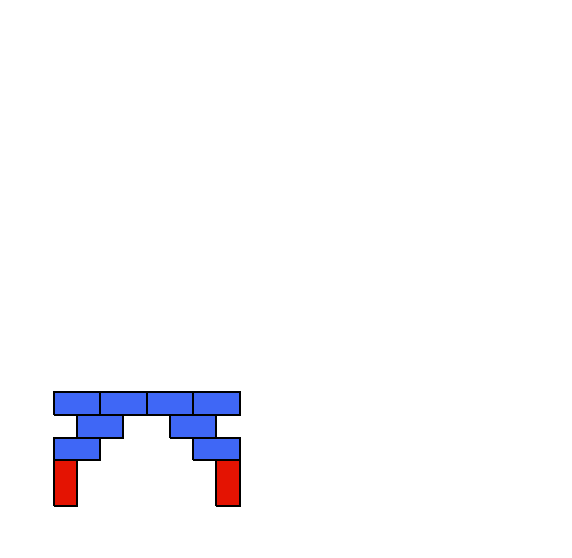

...

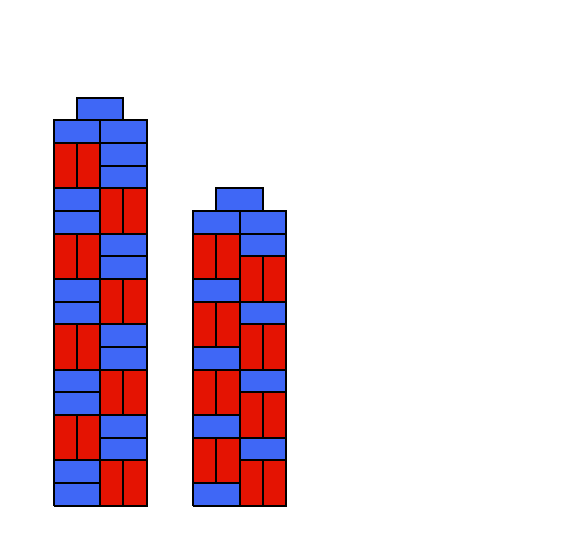

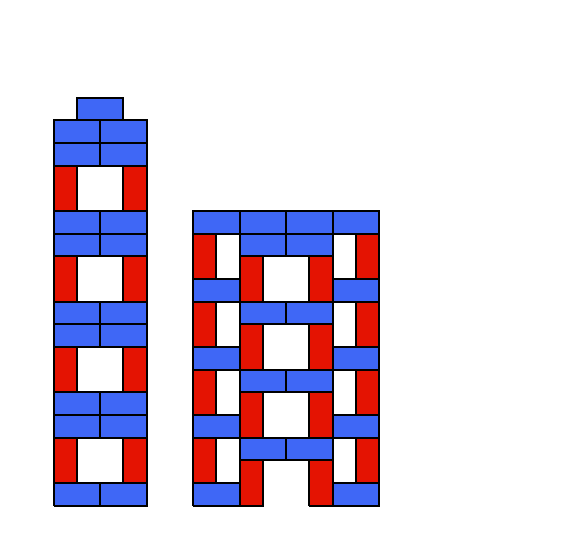

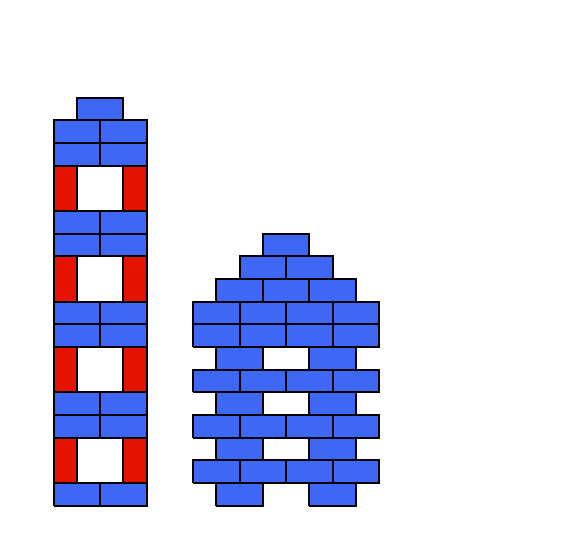

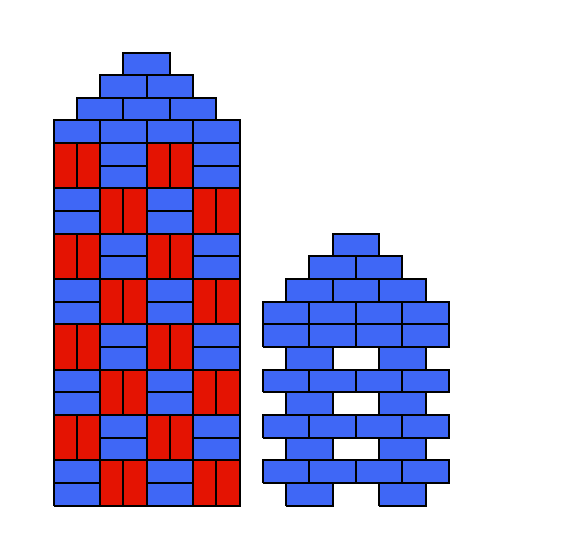

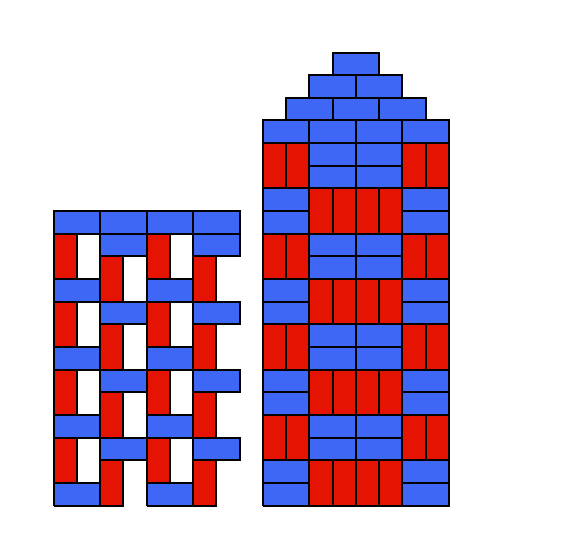

In [100]:
# export to inidividual pngs

for subdomain in subdomains:

    filepath ='./lax-structures-{}-all/'.format(subdomain)

    if not os.path.exists(filepath):
            os.makedirs(filepath)

    for i in df_subsets[subdomain].index:
        w = new_world()
        w.place_tower(df_subsets[subdomain].loc[i,'blocks'])
        fig = utils.draw_world(w)
        fig.savefig("./{}/lax-structures-{}-{}-all.png".format(filepath, 
                                                   df_subsets[subdomain].loc[i,'structure_type'],
                                                   str(df_subsets[subdomain].loc[i,'structure_number']).zfill(3)))
        

    df_subsets[subdomain].to_csv(filepath + 'df_{}.csv'.format(subdomain))

## summarize generation

In [431]:
# concat dataframes
df_structures = pd.concat([df_castles, df_skyscrapers, df_cities, df_bridges, df_houses], ignore_index=True)\
                .reset_index()

,index,structure_type,blocks,structure_width,structure_height,n_blocks,wall_height,wall_size,tower_height,roof_name,...,skyscraper_1_height,skyscraper_2_height,bridge_elevation,n_inner_arch,pillar_type,inner_width,outer_width,includes_outer_arches,house_width,n_stories
0,0,castle,"[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...",12.0,6.0,22.0,1.0,2.0,1.0,pyramid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,castle,"[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...",12.0,7.0,24.0,1.0,2.0,1.0,dome,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,castle,"[{'x': 1, 'y': 0, 'height': 2, 'width': 1}, {'...",14.0,6.0,28.0,1.0,2.0,1.0,pyramid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,castle,"[{'x': 1, 'y': 0, 'height': 2, 'width': 1}, {'...",14.0,7.0,32.0,1.0,2.0,1.0,dome,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,castle,"[{'x': 0, 'y': 0, 'height': 2, 'width': 1}, {'...",14.0,6.0,28.0,1.0,2.0,1.0,pyramid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72544,72544,house,"[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...",12.0,18.0,83.0,NaN,NaN,NaN,pyramids,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.0
72545,72545,house,"[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...",12.0,18.0,85.0,NaN,NaN,NaN,pyramids,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.0
72546,72546,house,"[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...",12.0,18.0,83.0,NaN,NaN,NaN,pyramids,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.0
72547,72547,house,"[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...",12.0,18.0,85.0,NaN,NaN,NaN,pyramids,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.0


### create dreamcoder program for each tower

In [432]:
df_structures['dreamcoder_program'] = df_structures['blocks'].apply(lambda x: convert(x, whole_squares=False))
df_structures['program_whole_squares'] = \
            df_structures['blocks'].apply(lambda x: convert(x, whole_squares=True))

### sample

Enumeration scripts above perform some sampling by rejecting structures according to `generation_probability`.

Here we shuffle, then select the first 250 structures.

In [474]:
random_seed = RANDOM_SEED

df_structures_subset = df_structures.groupby('structure_type').sample(frac=1, random_state=RANDOM_SEED)\
                                    .groupby('structure_type').head(250).reset_index()

df_structures_subset['structure_number'] = df_structures_subset.groupby(['structure_type']).cumcount();

df_structures_subset = df_structures_subset[df_structures_subset.structure_type!='skyscraper'].reset_index()

In [475]:
# order structures

structure_order = {}

structure_order['bridge'] = list(df_structures_subset[df_structures_subset.structure_type == 'bridge']\
    .sort_values(['includes_outer_arches', 'n_inner_arch', 'bridge_elevation', 'inner_width', 'structure_height']).sample_index)

structure_order['house'] = list(df_structures_subset[df_structures_subset.structure_type == 'house']\
    .sort_values(['n_stories','house_width']).sample_index)

structure_order['castle'] = list(df_structures_subset[df_structures_subset.structure_type == 'castle']\
    .sort_values(['wall_height','wall_size','tower_height','roof_name']).sample_index)

structure_order['city'] = list(df_structures_subset[df_structures_subset.structure_type == 'city']\
    .sort_values(['skyscraper_1_height', 'skyscraper_2_height', 'structure_height','gap']).sample_index)


In [477]:
df_structures_subset.groupby('structure_type')

In [434]:
N_TRAIN = 200
N_TEST = 50

# for g, group in enumerate(df_structures_subset['structure_type'].unique()):
#     df_structures_subset.loc[g*(N_TRAIN+N_TEST):g*(N_TRAIN+N_TEST)+N_TRAIN,'test_train'] = 'train'
#     df_structures_subset.loc[g*(N_TRAIN+N_TEST)+N_TRAIN:g*(N_TRAIN+N_TEST)+N_TRAIN+N_TRAIN,'test_train'] = 'test'

df_structures_subset['train'] = df_structures_subset['structure_number'] < N_TRAIN

In [435]:
df_structures_subset.groupby('structure_type')['train'].value_counts()

structure_type  train
bridge          True     200
                False     50
castle          True     200
                False     50
city            True     200
                False     50
house           True     200
                False     50
Name: train, dtype: int64

In [436]:
df_structures_subset.groupby('structure_type')['n_blocks'].describe()[['min','max']]

,min,max
structure_type,,
bridge,7.0,109.0
castle,24.0,149.0
city,14.0,132.0
house,7.0,93.0


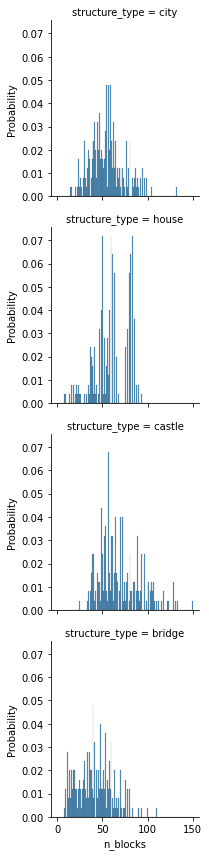

In [437]:
g = sns.FacetGrid(df_structures_subset, row="structure_type", row_order=['city','house','castle','bridge'])
g.map_dataframe(sns.histplot, x="n_blocks", binrange=(0,150), bins=150, stat='probability')

### export all structures

In [438]:
#all structures
df_structures_subset.to_csv('df_structures_subset.csv')

### export sample for upload to S3

In [439]:
# export to inidividual jsons

filepath ='./iclr-structures-json/'

if not os.path.exists(filepath):
        os.makedirs(filepath)

for i in df_structures_subset.index:
    df_structures_subset.loc[i].to_json("./{}/{}_{}_{}.json".format(filepath, 
                                               df_structures_subset.loc[i,'structure_type'],
                                               str(df_structures_subset.loc[i,'structure_number']).zfill(3),
                                               'train' if df_structures_subset.loc[i,'train'] else 'test'))
    
df_structures_subset.to_csv(filepath + 'df_structures_subset.csv')

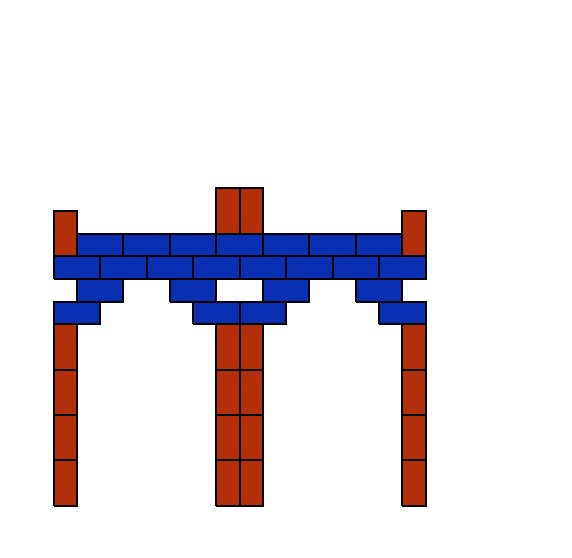

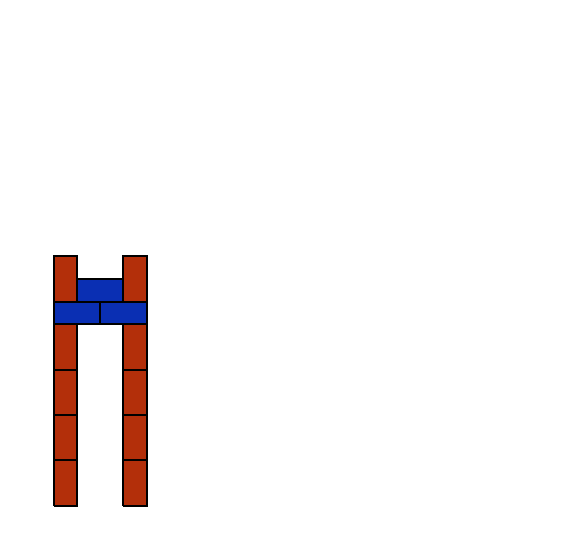

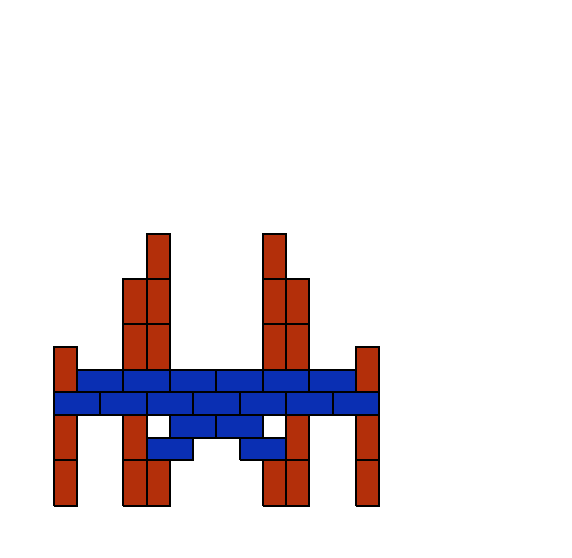

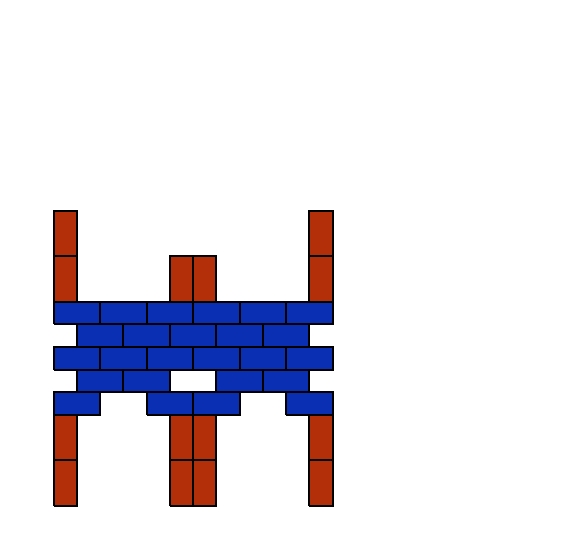

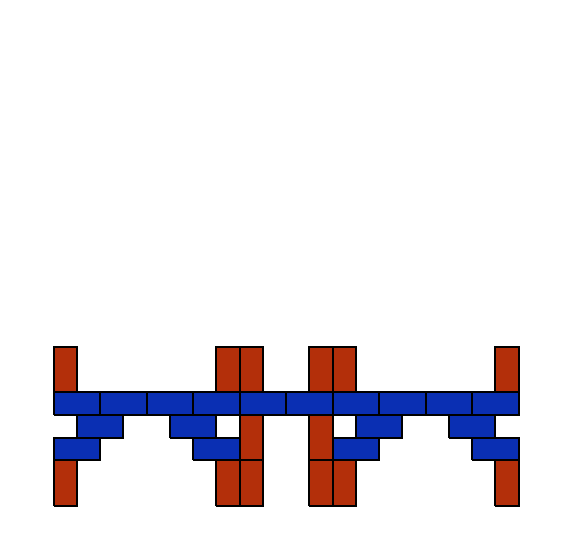

...

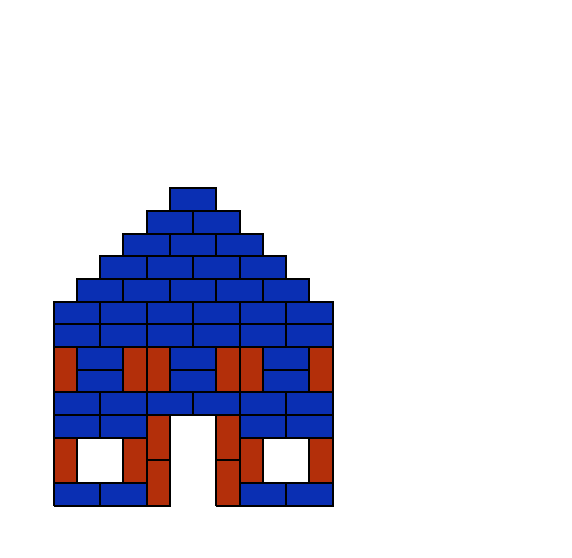

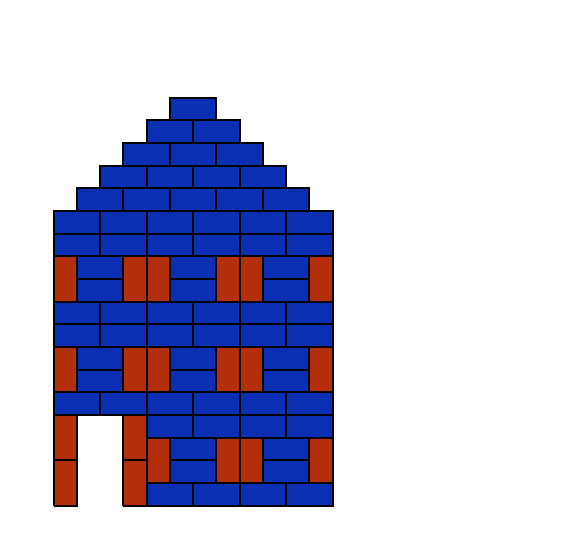

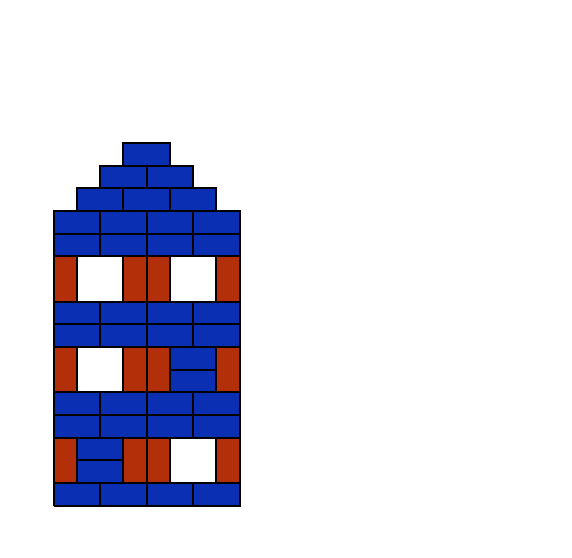

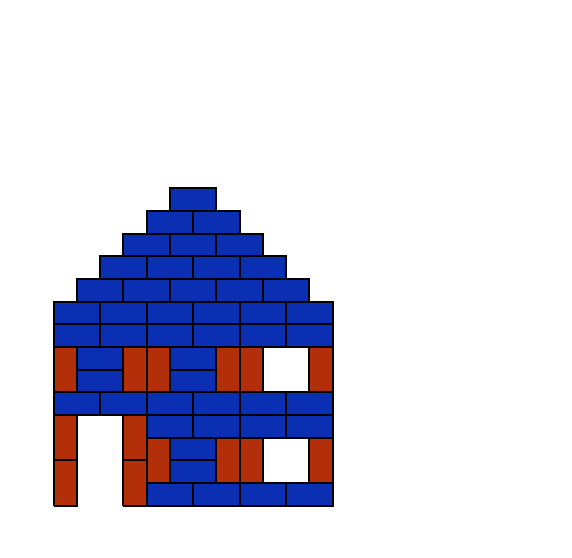

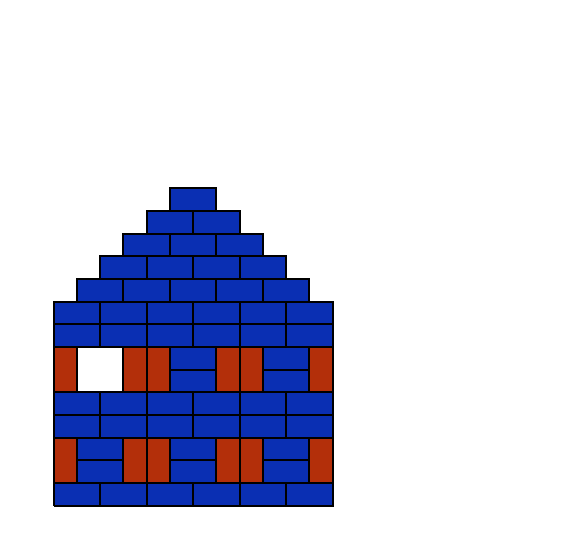

In [440]:
# export to inidividual images

filepath ='./iclr-structures-png/'

if not os.path.exists(filepath):
        os.makedirs(filepath)

for i in df_structures_subset.index:
    w = new_world()
    w.place_tower(df_structures_subset.loc[i,'blocks'])
    fig = utils.draw_world(w)
    fig.savefig("./{}/{}_{}_{}.png".format(filepath,
                                            df_structures_subset.loc[i,'structure_type'], 
                                            str(df_structures_subset.loc[i,'structure_number']).zfill(3),
                                            'train' if df_structures_subset.loc[i,'train'] else 'test'))
    
df_structures_subset.to_csv(filepath + 'df_structures_subset.csv')

In [446]:
# unordered gallery

filepath_in ='./iclr-structures-png/'
filepath_out ='./iclr-structures-gallery/'

if not os.path.exists(filepath_out):
        os.makedirs(filepath_out)

for structure in df_structures_subset['structure_type'].unique():
    
    fig, axes = plt.subplots(50, 5, figsize=(20,200))
    i = 0

    for row in range(0,50):
        for column in range(0,5):

            test_train = 'train' if i < N_TRAIN else 'test'

            image = plt.imread(filepath_in + structure + "_" +str(i).zfill(3) + "_" + test_train +  ".png")

            ax = axes[row, column]
            ax.set_title(str(i) + ", " + test_train)
            ax.axis('off')
            ax.imshow(image)
            i+=1

    plt.show()
    fig.savefig(filepath_out + structure + '_gallery.png', facecolor='w',transparent=False)
    print(structure + ' saved')

KeyboardInterrupt: 

In [447]:
# ordered gallery

structure_order = {}

structure_order['bridge'] = list(df_structures_subset[df_structures_subset.structure_type == 'bridge']\
    .sort_values(['includes_outer_arches', 'n_inner_arch', 'bridge_elevation', 'inner_width', 'structure_height']).structure_number)

structure_order['house'] = list(df_structures_subset[df_structures_subset.structure_type == 'house']\
    .sort_values(['n_stories','house_width']).structure_number)

structure_order['castle'] = list(df_structures_subset[df_structures_subset.structure_type == 'castle']\
    .sort_values(['wall_height','wall_size','tower_height','roof_name']).structure_number)

structure_order['city'] = list(df_structures_subset[df_structures_subset.structure_type == 'city']\
    .sort_values(['skyscraper_1_height', 'skyscraper_2_height', 'structure_height','gap']).structure_number)


In [ ]:
filepath_in ='./iclr-structures-png/'
filepath_out ='./iclr-structures-gallery/'

if not os.path.exists(filepath_out):
        os.makedirs(filepath_out)

for structure in df_structures_subset['structure_type'].unique():
    
    fig, axes = plt.subplots(25, 10, figsize=(40,100))
    i = 0
    

    for row in range(0,25):
        for column in range(0,10):

            structure_num = structure_order[structure][i]

            test_train = 'train' if structure_num < N_TRAIN else 'test'

            image = plt.imread(filepath_in + structure + "_" +str(structure_num).zfill(3) + "_" + test_train +  ".png")

            ax = axes[row, column]
            ax.set_title(str(structure_num) + ", " + test_train)
            ax.axis('off')
            ax.imshow(image)
            i+=1

#     plt.show()
    fig.savefig(filepath_out + structure + '_gallery.png', facecolor='w',transparent=False)
    print(structure + ' saved')

#### Test orderings

In [420]:
df_structures_subset.columns

Index(['index', 'structure_type', 'blocks', 'structure_width',
       'structure_height', 'n_blocks', 'wall_height', 'wall_size',
       'tower_height', 'roof_name', 'central_roof_size', 'tower_roof_size',
       'brick', 'skyscraper_height', 'roof_size', 'repeat_option', 't_1_brick',
       't_2_brick', 'gap', 'roof_1_name', 'roof_2_name', 'skyscraper_1_height',
       'skyscraper_2_height', 'bridge_elevation', 'n_inner_arch',
       'pillar_type', 'inner_width', 'outer_width', 'includes_outer_arches',
       'house_width', 'n_stories', 'dreamcoder_program',
       'program_whole_squares', 'structure_number', 'train'],
      dtype='object')

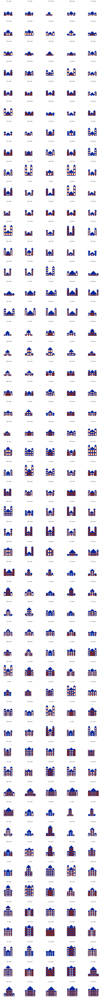

In [442]:
structure = 'castle'

fig, axes = plt.subplots(50, 5, figsize=(20,200))
i = 0

for row in range(0,50):
    for column in range(0,5):
        
        structure_num = structure_order[structure][i]

        test_train = 'train' if structure_num < N_TRAIN else 'test'

        image = plt.imread(filepath_in + structure + "_" +str(structure_num).zfill(3) + "_" + test_train +  ".png")

        ax = axes[row, column]
        ax.set_title(str(structure_num) + ", " + test_train)
        ax.axis('off')
        ax.imshow(image)
        i+=1

plt.show()

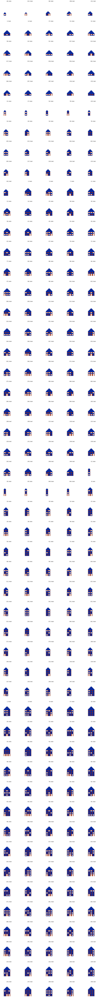

In [443]:
structure = 'house'

fig, axes = plt.subplots(50, 5, figsize=(20,200))
i = 0

for row in range(0,50):
    for column in range(0,5):
        
        structure_num = structure_order[structure][i]

        test_train = 'train' if structure_num < N_TRAIN else 'test'

        image = plt.imread(filepath_in + structure + "_" +str(structure_num).zfill(3) + "_" + test_train +  ".png")

        ax = axes[row, column]
        ax.set_title(str(structure_num) + ", " + test_train)
        ax.axis('off')
        ax.imshow(image)
        i+=1

plt.show()

# Enumerate structures with top-down programs

In [61]:
def init_abstractions():
    top_down_abstractions = {}
    top_down_abstractions['low_level_parts'] = []       # rows, doors, windows
    top_down_abstractions['low_level_part_types'] = [] 
    top_down_abstractions['low_level_part_params'] = [] 
    top_down_abstractions['mid_level_parts'] = []       # floors, pyramid-roof
    top_down_abstractions['mid_level_part_types'] = [] 
    top_down_abstractions['mid_level_part_params'] = [] 
    top_down_abstractions['high_level_parts'] = []      # building, pyramid-roof
    top_down_abstractions['high_level_part_types'] = [] 
    top_down_abstractions['high_level_part_params'] = []
    
    return top_down_abstractions

## Enumerate Bridges

In [360]:
random.seed(RANDOM_SEED) # unused in bridges right now 

In [361]:
MIN_N_ARCHES = 1
MAX_N_ARCHES = 5
MAX_BRIDGE_ELEVATION = 5

INNER_ARCH_WIDTHS = [4, 6, 8]
OUTER_ARCH_WIDTHS = [0, 4, 6, 8]

MIN_BRIDGE_THICKNESS = 0
MAX_BRIDGE_THICKNESS = 2

PILLAR_TYPES = ['none','uniform','high_middle','high_ends']

In [261]:
# bridges = []
# df_bridges = pd.DataFrame()

# for n_inner_arch in range(MIN_N_ARCHES, MAX_N_ARCHES+1):

#     for bridge_elevation in range(1, MAX_BRIDGE_ELEVATION):

#         for inner_width in INNER_ARCH_WIDTHS:

#             for outer_width in OUTER_ARCH_WIDTHS:
                
#                 for pillar_type in PILLAR_TYPES:
                    
#                     for bridge_thickness in range(MIN_BRIDGE_THICKNESS, MAX_BRIDGE_THICKNESS+1):

#                         if outer_width == inner_width:
#                             continue

#                         w = new_world()
#                         top_down_abstractions = init_abstractions()

#                         # create outer arches
#                         if outer_width != 0:
#                             outer_arch = ARCHES_EQUAL_HEIGHTS[outer_width]
#                             outer_arch_world = new_world()
#                             outer_arch_world.place_tower(outer_arch)


#                         # create inner arches
#                         inner_arch = ARCHES_EQUAL_HEIGHTS[inner_width]
#                         inner_arch_world = new_world()
#                         inner_arch_world.place_tower(inner_arch)


#                         if outer_width != 0:
#                             # place blocks under left outer arch
#                             for j in range(0, bridge_elevation):
#                                 w.place_tower(VERTICAL, 
#                                               x_location=0)
#                                 w.place_tower(VERTICAL, 
#                                               x_location=outer_width-1)
                            
#                             if bridge_elevation > 0:
#                                 for side in [1,2]:
#                                     top_down_abstractions['low_level_parts'].append('pillar')
#                                     top_down_abstractions['low_level_part_types'].append('pillar')
#                                     top_down_abstractions['low_level_part_params'].append(str(bridge_elevation))
#                                 top_down_abstractions['mid_level_parts'].append('pillar-pair')
#                                 top_down_abstractions['mid_level_part_types'].append('pillar-pair')
#                                 top_down_abstractions['mid_level_part_params'].append(str(bridge_elevation))
#                                 top_down_abstractions['mid_level_part_params'].append(str(outer_width))

#                             # place left outer arch
#                             w.place_tower(outer_arch) #TODO ADD ARCH
#                             top_down_abstractions['low_level_parts'].append('arch')
#                             top_down_abstractions['low_level_part_types'].append('arch-'+str(outer_width))
#                             top_down_abstractions['mid_level_parts'].append('arch')
#                             top_down_abstractions['mid_level_part_types'].append('arch-'+str(outer_width))
#                             top_down_abstractions['high_level_parts'].append('arch-set-parameterized')
#                             top_down_abstractions['high_level_part_types'].append('arch-set-parameterized-'+str(outer_width))
#                             top_down_abstractions['high_level_part_params'].append(str(bridge_elevation)) #height matched by other arch so no need for params there


#                         for i in range(0,n_inner_arch):
#                             # place blocks under inner arches
#                             for j in range(0, bridge_elevation):
#                                 w.place_tower(VERTICAL, 
#                                               x_location=outer_width+(i*inner_width))
#                                 w.place_tower(VERTICAL, 
#                                               x_location=outer_width+((i+1)*inner_width)-1)
                                
#                             if bridge_elevation > 0:
#                                 for side in [1,2]:
#                                     top_down_abstractions['low_level_parts'].append('pillar')
#                                     top_down_abstractions['low_level_part_types'].append('pillar')
#                                     top_down_abstractions['low_level_part_params'].append(str(bridge_elevation))
#                                 top_down_abstractions['mid_level_parts'].append('pillar-pair')
#                                 top_down_abstractions['mid_level_part_types'].append('pillar-pair')
#                                 top_down_abstractions['mid_level_part_params'].append(str(bridge_elevation))
#                                 top_down_abstractions['mid_level_part_params'].append(str(inner_width))
                                
#                             # place inner arch
#                             w.place_tower(inner_arch,
#                                           x_location=outer_width+i*inner_width) #TODO ADD ARCH
#                             top_down_abstractions['low_level_parts'].append('arch')
#                             top_down_abstractions['low_level_part_types'].append('arch-'+str(inner_width))
#                             top_down_abstractions['mid_level_parts'].append('arch')
#                             top_down_abstractions['mid_level_part_types'].append('arch-'+str(inner_width))
                            
#                         if n_inner_arch > 0:
#                             top_down_abstractions['high_level_parts'].append('arch-set-parameterized')
#                             top_down_abstractions['high_level_part_types'].append('arch-set-parameterized-'+str(inner_width))
#                             top_down_abstractions['high_level_part_params'].append(str(bridge_elevation)) #height matched by other arch so no need for params there
#                             top_down_abstractions['high_level_part_params'].append(str(n_inner_arch)) #height matched by other arch so no need for params there

#                         if bridge_elevation > 0:
# #                             top_down_abstractions['high_level_parts'].append('pillar-set')
# #                             top_down_abstractions['high_level_part_types'].append('pillar-set')
#                             top_down_abstractions['high_level_part_params'].append(str(bridge_elevation))
                        
#                         if outer_width != 0:
#                             # place blocks under right outer arch
#                             for j in range(0, bridge_elevation):
#                                 w.place_tower(VERTICAL, 
#                                               x_location=outer_width+(n_inner_arch*inner_width))
#                                 w.place_tower(VERTICAL, 
#                                               x_location=outer_width+(n_inner_arch*inner_width)+outer_width-1)
                            
#                             if bridge_elevation > 0:
                                
#                                 for side in [1,2]:
#                                     top_down_abstractions['low_level_parts'].append('pillar')
#                                     top_down_abstractions['low_level_part_types'].append('pillar')
#                                     top_down_abstractions['low_level_part_params'].append(str(bridge_elevation))
#                                 top_down_abstractions['mid_level_parts'].append('pillar-pair')
#                                 top_down_abstractions['mid_level_part_types'].append('pillar-pair')
#                                 top_down_abstractions['mid_level_part_params'].append(str(bridge_elevation))
#                                 top_down_abstractions['mid_level_part_params'].append(str(outer_width))


#                                                             # place right outer arch
#                             w.place_tower(outer_arch,
#                                           x_location=outer_width+(n_inner_arch*inner_width)) #TODO ADD ARCH
#                             top_down_abstractions['low_level_parts'].append('arch')
#                             top_down_abstractions['low_level_part_types'].append('arch-'+str(outer_width))
#                             top_down_abstractions['mid_level_parts'].append('arch')
#                             top_down_abstractions['mid_level_part_types'].append('arch-'+str(outer_width))
# #                             top_down_abstractions['high_level_parts'].append('arch-parameterized')
# #                             top_down_abstractions['high_level_part_types'].append('arch-parameterized-'+str(outer_width))


#                         # Add layer of blue    
#                         for i in range(0, bridge_thickness):
#                             if i%2 == 0:
#                                 horizontal_brick_layer(w, w.tower_width()-2, x_location = 1)
#                                 top_down_abstractions['low_level_parts'].append('row')
#                                 top_down_abstractions['low_level_part_types'].append('row-thin')
#                             else:
#                                 horizontal_brick_layer(w, w.tower_width(), x_location = 0)
#                                 top_down_abstractions['low_level_parts'].append('row')
#                                 top_down_abstractions['low_level_part_types'].append('row-thick')
                                
#                         if bridge_thickness > 0:
#                             top_down_abstractions['mid_level_parts'].append('viaduct')
#                             top_down_abstractions['mid_level_part_types'].append('viaduct')
#                             top_down_abstractions['mid_level_part_params'].append(str(bridge_thickness))
#                             top_down_abstractions['high_level_parts'].append('viaduct')
#                             top_down_abstractions['high_level_part_types'].append('viaduct')
#                             top_down_abstractions['high_level_part_params'].append(str(bridge_thickness))
                            
                            
#                         # find where to place suspension pillars
#                         if pillar_type != 'none':
#                             arch_widths = []

#                             if outer_width > 0:
#                                 arch_widths.append(outer_width)

#                             for i in range(0, n_inner_arch):
#                                 arch_widths.append(inner_width)

#                             if outer_width > 0:
#                                 arch_widths.append(outer_width)

#                             arch_widths

#                             pillar_locations = []

#                             for arch_width in arch_widths:

#                                 if pillar_locations == []:
#                                     pillar_locations.append(0)
#                                     pillar_locations.append(arch_width-1)
#                                 else:
#                                     pillar_locations.append(pillar_locations[-1]+1)
#                                     pillar_locations.append(pillar_locations[-1]+arch_width-1)


#                             if pillar_type == 'uniform':
#                                 top_down_abstractions['high_level_parts'].append('suspension')
#                                 top_down_abstractions['high_level_part_types'].append('suspension-uniform')
                                
#                                 top_down_abstractions['mid_level_parts'].append('suspension')
#                                 top_down_abstractions['mid_level_part_types'].append('suspension-uniform')
                                
#                                 for x_location in pillar_locations:
#                                     w.place_tower(VERTICAL, 
#                                                   x_location=x_location)
#                                     top_down_abstractions['low_level_parts'].append('pillar')
#                                     top_down_abstractions['low_level_part_types'].append('pillar')
#                                     top_down_abstractions['low_level_part_params'].append(str(1))


#                             elif (pillar_type == 'high_middle'):
#                                 top_down_abstractions['high_level_parts'].append('suspension')
#                                 top_down_abstractions['high_level_part_types'].append('suspension-highmiddle')
                                
#                                 if (len(pillar_locations) <= 2):
#                                     continue
#                                 else:

#                                     p_i = 0
#                                     while len(pillar_locations)>=2:
#                                         p_i += 1
#                                         for x_location in pillar_locations:
#                                             w.place_tower(VERTICAL, 
#                                                           x_location=x_location)

#                                         # ignoring order of placement
#                                         # first pillar
#                                         top_down_abstractions['low_level_parts'].append('pillar')
#                                         top_down_abstractions['low_level_part_types'].append('pillar')
#                                         top_down_abstractions['low_level_part_params'].append(str(p_i))
                                        
#                                         # last pillar
#                                         top_down_abstractions['low_level_parts'].append('pillar')
#                                         top_down_abstractions['low_level_part_types'].append('pillar')
#                                         top_down_abstractions['low_level_part_params'].append(str(p_i))
                                        
#                                         #both ends pillars
#                                         top_down_abstractions['mid_level_parts'].append('pillar-pair')
#                                         top_down_abstractions['mid_level_part_types'].append('pillar-pair')
#                                         top_down_abstractions['mid_level_part_params'].append(str(pillar_locations[-1]-pillar_locations[0]))
#                                         top_down_abstractions['mid_level_part_params'].append(str(p_i))
                                        
#                                         pillar_locations = pillar_locations[1:-1]
                                        
                                        

#                             elif pillar_type == 'high_ends':
#                                 top_down_abstractions['high_level_parts'].append('suspension')
#                                 top_down_abstractions['high_level_part_types'].append('suspension-highends')
                                
#                                 if (len(pillar_locations) <= 2):
#                                     continue
                                    
#                                 else:

#                                     p_i = 0
#                                     while len(pillar_locations)>=2:
#                                         p_i += 1
#                                         for x_location in pillar_locations:
#                                             w.place_tower(VERTICAL, 
#                                                           x_location=x_location)

#                                         # ignoring order of placement
#                                         # first pillar
#                                         top_down_abstractions['low_level_parts'].append('pillar')
#                                         top_down_abstractions['low_level_part_types'].append('pillar')
#                                         top_down_abstractions['low_level_part_params'].append(str(p_i))
                                        
#                                         # last pillar
#                                         top_down_abstractions['low_level_parts'].append('pillar')
#                                         top_down_abstractions['low_level_part_types'].append('pillar')
#                                         top_down_abstractions['low_level_part_params'].append(str(p_i))
                                        
#                                         #both ends pillars
#                                         top_down_abstractions['mid_level_parts'].append('pillar-pair')
#                                         top_down_abstractions['mid_level_part_types'].append('pillar-pair')
#                                         top_down_abstractions['mid_level_part_params'].append(str(pillar_locations[1]-pillar_locations[-1]))
#                                         top_down_abstractions['mid_level_part_params'].append(str(p_i))
                                            
#                                         pillar_locations = pillar_locations[0:int(len(pillar_locations)/2)-1] + pillar_locations[int(len(pillar_locations)/2)+1:]


#                         if not(w.broken):
#                                 bridges.append(w)
#                                 df_bridges = df_bridges.append(
#                                     {
#                                         'structure_type': 'bridge',
#                                         'blocks': w.get_block_dict()['blocks'],
#                                         'structure_width': w.tower_width(),
#                                         'structure_height': w.tower_height(),
#                                         'bridge_elevation': bridge_elevation,
#                                         'n_blocks': len(w.blocks),
#                                         'n_inner_arch': n_inner_arch,
#                                         'pillar_type': pillar_type,
#                                         'inner_width': inner_width,
#                                         'outer_width': outer_width,
#                                         'includes_outer_arches': outer_width != 0,
#                                         'top_down_abstractions':top_down_abstractions,
#                                         'low_level_parts' : top_down_abstractions['low_level_parts'],
#                                         'low_level_part_types' : top_down_abstractions['low_level_part_types'],
#                                         'low_level_part_params' : top_down_abstractions['low_level_part_params'],
#                                         'mid_level_parts' : top_down_abstractions['mid_level_parts'],
#                                         'mid_level_part_types' : top_down_abstractions['mid_level_part_types'],
#                                         'mid_level_part_params' : top_down_abstractions['mid_level_part_params'],
#                                         'high_level_parts' : top_down_abstractions['high_level_parts'],
#                                         'high_level_part_types' : top_down_abstractions['high_level_part_types'],
#                                         'high_level_part_params' : top_down_abstractions['high_level_part_params']
#                                     }, ignore_index=True
#                                 )

# print(str(len(bridges)) + ' bridges generated')

744 bridges generated


In [362]:
# Updated to bring in line with other subdomains

bridges = []
df_bridges = pd.DataFrame()

for n_inner_arch in range(MIN_N_ARCHES, MAX_N_ARCHES+1):

    for bridge_elevation in range(1, MAX_BRIDGE_ELEVATION):

        for inner_width in INNER_ARCH_WIDTHS:

            for outer_width in OUTER_ARCH_WIDTHS:
                
                for pillar_type in PILLAR_TYPES:
                    
                    for bridge_thickness in range(MIN_BRIDGE_THICKNESS, MAX_BRIDGE_THICKNESS+1):

                        if outer_width == inner_width:
                            continue

                        w = new_world()
                        top_down_abstractions = init_abstractions()
                        arch_set_id = 'arch-set'
                        
                        # create outer arches
                        if outer_width != 0:
                            outer_arch = ARCHES_EQUAL_HEIGHTS[outer_width]
                            outer_arch_world = new_world()
                            outer_arch_world.place_tower(outer_arch)
                            arch_set_id += '-' + str(outer_width)


                        # create inner arches
                        inner_arch = ARCHES_EQUAL_HEIGHTS[inner_width]
                        inner_arch_world = new_world()
                        inner_arch_world.place_tower(inner_arch)
                        
                        top_down_abstractions['high_level_parts'].append('arch-set-parameterized')
                        top_down_abstractions['high_level_part_params'].append(str(bridge_elevation))

                        if outer_width != 0:
                            # place blocks under left outer arch
                            for j in range(0, bridge_elevation):
                                w.place_tower(VERTICAL, 
                                              x_location=0)
                                w.place_tower(VERTICAL, 
                                              x_location=outer_width-1)
                            
                            if bridge_elevation > 0:
                                for side in [1,2]:
                                    top_down_abstractions['low_level_parts'].append('pillar')
                                    top_down_abstractions['low_level_part_types'].append('pillar')
                                    top_down_abstractions['low_level_part_params'].append(str(bridge_elevation))
                                top_down_abstractions['mid_level_parts'].append('pillar-pair')
                                top_down_abstractions['mid_level_part_types'].append('pillar-pair')
                                top_down_abstractions['mid_level_part_params'].append(str(bridge_elevation))
                                top_down_abstractions['mid_level_part_params'].append(str(outer_width))

                            # place left outer arch
                            w.place_tower(outer_arch) #TODO ADD ARCH
                            top_down_abstractions['low_level_parts'].append('arch')
                            top_down_abstractions['low_level_part_types'].append('arch-'+str(outer_width))
                            top_down_abstractions['mid_level_parts'].append('arch')
                            top_down_abstractions['mid_level_part_types'].append('arch-'+str(outer_width))
                            
                            top_down_abstractions['high_level_part_params'].append(str(bridge_elevation)) #height matched by other arch so no need for params there


                        for i in range(0,n_inner_arch):
                            # place blocks under inner arches
                            
                            arch_set_id += '-' + str(inner_width)
                            
                            for j in range(0, bridge_elevation):
                                w.place_tower(VERTICAL, 
                                              x_location=outer_width+(i*inner_width))
                                w.place_tower(VERTICAL, 
                                              x_location=outer_width+((i+1)*inner_width)-1)
                                
                            if bridge_elevation > 0:
                                for side in [1,2]:
                                    top_down_abstractions['low_level_parts'].append('pillar')
                                    top_down_abstractions['low_level_part_types'].append('pillar')
                                    top_down_abstractions['low_level_part_params'].append(str(bridge_elevation))
                                top_down_abstractions['mid_level_parts'].append('pillar-pair')
                                top_down_abstractions['mid_level_part_types'].append('pillar-pair')
                                top_down_abstractions['mid_level_part_params'].append(str(bridge_elevation))
                                top_down_abstractions['mid_level_part_params'].append(str(inner_width))
                                
                            # place inner arch
                            w.place_tower(inner_arch,
                                          x_location=outer_width+i*inner_width) #TODO ADD ARCH
                            top_down_abstractions['low_level_parts'].append('arch')
                            top_down_abstractions['low_level_part_types'].append('arch-'+str(inner_width))
                            top_down_abstractions['mid_level_parts'].append('arch')
                            top_down_abstractions['mid_level_part_types'].append('arch-'+str(inner_width))
                            
#                         if n_inner_arch > 0:
# #                             top_down_abstractions['high_level_parts'].append('arch-set-parameterized')
# #                             top_down_abstractions['high_level_part_types'].append('arch-set-parameterized-'+str(inner_width))
# #                             top_down_abstractions['high_level_part_params'].append(str(bridge_elevation)) #height matched by other arch so no need for params there
# #                             top_down_abstractions['high_level_part_params'].append(str(n_inner_arch)) #height matched by other arch so no need for params there

#                         if bridge_elevation > 0:
# #                             top_down_abstractions['high_level_parts'].append('pillar-set')
# #                             top_down_abstractions['high_level_part_types'].append('pillar-set')
# #                             top_down_abstractions['high_level_part_params'].append(str(bridge_elevation))
                        
                        if outer_width != 0:
                            arch_set_id += '-' + str(outer_width)
                            # place blocks under right outer arch
                            for j in range(0, bridge_elevation):
                                w.place_tower(VERTICAL, 
                                              x_location=outer_width+(n_inner_arch*inner_width))
                                w.place_tower(VERTICAL, 
                                              x_location=outer_width+(n_inner_arch*inner_width)+outer_width-1)
                            
                            if bridge_elevation > 0:
                                
                                for side in [1,2]:
                                    top_down_abstractions['low_level_parts'].append('pillar')
                                    top_down_abstractions['low_level_part_types'].append('pillar')
                                    top_down_abstractions['low_level_part_params'].append(str(bridge_elevation))
                                top_down_abstractions['mid_level_parts'].append('pillar-pair')
                                top_down_abstractions['mid_level_part_types'].append('pillar-pair')
                                top_down_abstractions['mid_level_part_params'].append(str(bridge_elevation))
                                top_down_abstractions['mid_level_part_params'].append(str(outer_width))


                                                            # place right outer arch
                            w.place_tower(outer_arch,
                                          x_location=outer_width+(n_inner_arch*inner_width)) #TODO ADD ARCH
                            top_down_abstractions['low_level_parts'].append('arch')
                            top_down_abstractions['low_level_part_types'].append('arch-'+str(outer_width))
                            top_down_abstractions['mid_level_parts'].append('arch')
                            top_down_abstractions['mid_level_part_types'].append('arch-'+str(outer_width))
#                             top_down_abstractions['high_level_parts'].append('arch-parameterized')
#                             top_down_abstractions['high_level_part_types'].append('arch-parameterized-'+str(outer_width))


                        # Add layer of blue    
                        for i in range(0, bridge_thickness):
                            if i%2 == 0:
                                horizontal_brick_layer(w, w.tower_width()-2, x_location = 1)
                                top_down_abstractions['low_level_parts'].append('row')
                                top_down_abstractions['low_level_part_types'].append('row-thin')
                            else:
                                horizontal_brick_layer(w, w.tower_width(), x_location = 0)
                                top_down_abstractions['low_level_parts'].append('row')
                                top_down_abstractions['low_level_part_types'].append('row-thick')
                                
                        if bridge_thickness > 0:
                            top_down_abstractions['mid_level_parts'].append('viaduct')
                            top_down_abstractions['mid_level_part_types'].append('viaduct')
                            top_down_abstractions['mid_level_part_params'].append(str(bridge_thickness))
                            top_down_abstractions['high_level_parts'].append('viaduct')
                            top_down_abstractions['high_level_part_types'].append('viaduct')
                            top_down_abstractions['high_level_part_params'].append(str(bridge_thickness))
                            
                            
                        # find where to place suspension pillars
                        if pillar_type != 'none':
                            arch_widths = []

                            if outer_width > 0:
                                arch_widths.append(outer_width)

                            for i in range(0, n_inner_arch):
                                arch_widths.append(inner_width)

                            if outer_width > 0:
                                arch_widths.append(outer_width)

                            arch_widths

                            pillar_locations = []

                            for arch_width in arch_widths:

                                if pillar_locations == []:
                                    pillar_locations.append(0)
                                    pillar_locations.append(arch_width-1)
                                else:
                                    pillar_locations.append(pillar_locations[-1]+1)
                                    pillar_locations.append(pillar_locations[-1]+arch_width-1)


                            if pillar_type == 'uniform':
                                top_down_abstractions['high_level_parts'].append('suspension')
                                top_down_abstractions['high_level_part_types'].append('suspension-uniform')
                                
                                top_down_abstractions['mid_level_parts'].append('suspension')
                                top_down_abstractions['mid_level_part_types'].append('suspension-uniform')
                                
                                for x_location in pillar_locations:
                                    w.place_tower(VERTICAL, 
                                                  x_location=x_location)
                                    top_down_abstractions['low_level_parts'].append('pillar')
                                    top_down_abstractions['low_level_part_types'].append('pillar')
                                    top_down_abstractions['low_level_part_params'].append(str(1))


                            elif (pillar_type == 'high_middle'):
                                top_down_abstractions['high_level_parts'].append('suspension')
                                top_down_abstractions['high_level_part_types'].append('suspension-highmiddle')
                                
                                if (len(pillar_locations) <= 2):
                                    continue
                                else:

                                    p_i = 0
                                    while len(pillar_locations)>=2:
                                        p_i += 1
                                        for x_location in pillar_locations:
                                            w.place_tower(VERTICAL, 
                                                          x_location=x_location)

                                        # ignoring order of placement
                                        # first pillar
                                        top_down_abstractions['low_level_parts'].append('pillar')
                                        top_down_abstractions['low_level_part_types'].append('pillar')
                                        top_down_abstractions['low_level_part_params'].append(str(p_i))
                                        
                                        # last pillar
                                        top_down_abstractions['low_level_parts'].append('pillar')
                                        top_down_abstractions['low_level_part_types'].append('pillar')
                                        top_down_abstractions['low_level_part_params'].append(str(p_i))
                                        
                                        #both ends pillars
                                        top_down_abstractions['mid_level_parts'].append('pillar-pair')
                                        top_down_abstractions['mid_level_part_types'].append('pillar-pair')
                                        top_down_abstractions['mid_level_part_params'].append(str(pillar_locations[-1]-pillar_locations[0]))
                                        top_down_abstractions['mid_level_part_params'].append(str(p_i))
                                        
                                        pillar_locations = pillar_locations[1:-1]
                                        
                                        

                            elif pillar_type == 'high_ends':
                                top_down_abstractions['high_level_parts'].append('suspension')
                                top_down_abstractions['high_level_part_types'].append('suspension-highends')
                                
                                if (len(pillar_locations) <= 2):
                                    continue
                                    
                                else:

                                    p_i = 0
                                    while len(pillar_locations)>=2:
                                        p_i += 1
                                        for x_location in pillar_locations:
                                            w.place_tower(VERTICAL, 
                                                          x_location=x_location)

                                        # ignoring order of placement
                                        # first pillar
                                        top_down_abstractions['low_level_parts'].append('pillar')
                                        top_down_abstractions['low_level_part_types'].append('pillar')
                                        top_down_abstractions['low_level_part_params'].append(str(p_i))
                                        
                                        # last pillar
                                        top_down_abstractions['low_level_parts'].append('pillar')
                                        top_down_abstractions['low_level_part_types'].append('pillar')
                                        top_down_abstractions['low_level_part_params'].append(str(p_i))
                                        
                                        #both ends pillars
                                        top_down_abstractions['mid_level_parts'].append('pillar-pair')
                                        top_down_abstractions['mid_level_part_types'].append('pillar-pair')
                                        top_down_abstractions['mid_level_part_params'].append(str(pillar_locations[1]-pillar_locations[-1]))
                                        top_down_abstractions['mid_level_part_params'].append(str(p_i))
                                            
                                        pillar_locations = pillar_locations[0:int(len(pillar_locations)/2)-1] + pillar_locations[int(len(pillar_locations)/2)+1:]

                        top_down_abstractions['high_level_part_types'].append(arch_set_id)
                        
                        if not(w.broken):
                                bridges.append(w)
                                df_bridges = df_bridges.append(
                                    {
                                        'structure_type': 'bridge',
                                        'blocks': w.get_block_dict()['blocks'],
                                        'structure_width': w.tower_width(),
                                        'structure_height': w.tower_height(),
                                        'bridge_elevation': bridge_elevation,
                                        'n_blocks': len(w.blocks),
                                        'n_inner_arch': n_inner_arch,
                                        'pillar_type': pillar_type,
                                        'inner_width': inner_width,
                                        'outer_width': outer_width,
                                        'includes_outer_arches': outer_width != 0,
                                        'top_down_abstractions':top_down_abstractions,
                                        'low_level_parts' : top_down_abstractions['low_level_parts'],
                                        'low_level_part_types' : top_down_abstractions['low_level_part_types'],
                                        'low_level_part_params' : top_down_abstractions['low_level_part_params'],
                                        'mid_level_parts' : top_down_abstractions['mid_level_parts'],
                                        'mid_level_part_types' : top_down_abstractions['mid_level_part_types'],
                                        'mid_level_part_params' : top_down_abstractions['mid_level_part_params'],
                                        'high_level_parts' : top_down_abstractions['high_level_parts'],
                                        'high_level_part_types' : top_down_abstractions['high_level_part_types'],
                                        'high_level_part_params' : top_down_abstractions['high_level_part_params']
                                    }, ignore_index=True
                                )

print(str(len(bridges)) + ' bridges generated')

744 bridges generated


{'low_level_parts': ['pillar', 'pillar', 'arch'], 'low_level_part_types': ['pillar', 'pillar', 'arch-4'], 'low_level_part_params': ['1', '1'], 'mid_level_parts': ['pillar-pair', 'arch'], 'mid_level_part_types': ['pillar-pair', 'arch-4'], 'mid_level_part_params': ['1', '4'], 'high_level_parts': ['arch-set-parameterized'], 'high_level_part_types': ['arch-set-4'], 'high_level_part_params': ['1']}


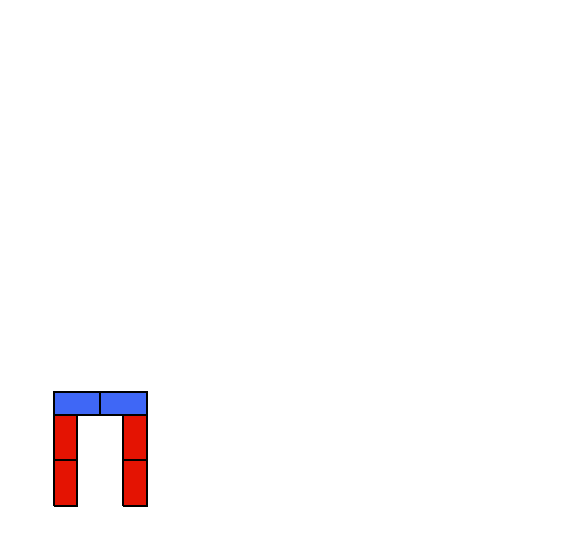

{'low_level_parts': ['pillar', 'pillar', 'arch', 'pillar', 'pillar', 'arch', 'pillar', 'pillar', 'arch', 'row', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar'], 'low_level_part_types': ['pillar', 'pillar', 'arch-8', 'pillar', 'pillar', 'arch-4', 'pillar', 'pillar', 'arch-8', 'row-thin', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar'], 'low_level_part_params': ['2', '2', '2', '2', '2', '2', '1', '1', '1', '1', '1', '1'], 'mid_level_parts': ['pillar-pair', 'arch', 'pillar-pair', 'arch', 'pillar-pair', 'arch', 'viaduct', 'suspension'], 'mid_level_part_types': ['pillar-pair', 'arch-8', 'pillar-pair', 'arch-4', 'pillar-pair', 'arch-8', 'viaduct', 'suspension-uniform'], 'mid_level_part_params': ['2', '8', '2', '4', '2', '8', '1'], 'high_level_parts': ['arch-set-parameterized', 'viaduct', 'suspension'], 'high_level_part_types': ['viaduct', 'suspension-uniform', 'arch-set-8-4-8'], 'high_level_part_params': ['2', '2', '1']}


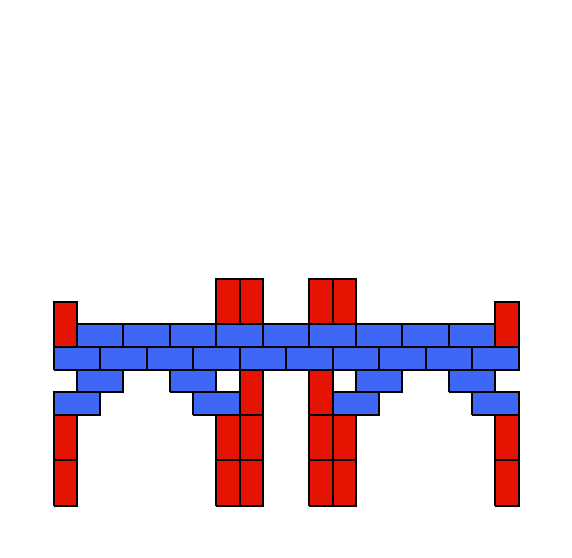

{'low_level_parts': ['pillar', 'pillar', 'arch', 'pillar', 'pillar', 'arch', 'pillar', 'pillar', 'arch', 'row', 'row', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar'], 'low_level_part_types': ['pillar', 'pillar', 'arch-4', 'pillar', 'pillar', 'arch-6', 'pillar', 'pillar', 'arch-4', 'row-thin', 'row-thick', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar'], 'low_level_part_params': ['3', '3', '3', '3', '3', '3', '1', '1', '2', '2', '3', '3'], 'mid_level_parts': ['pillar-pair', 'arch', 'pillar-pair', 'arch', 'pillar-pair', 'arch', 'viaduct', 'pillar-pair', 'pillar-pair', 'pillar-pair'], 'mid_level_part_types': ['pillar-pair', 'arch-4', 'pillar-pair', 'arch-6', 'pillar-pair', 'arch-4', 'viaduct', 'pillar-pair', 'pillar-pair', 'pillar-pair'], 'mid_level_part_params': ['3', '4', '3', '6', '3', '4', '2', '13', '1', '7', '2', '5', '3'], 'high_level_parts': ['arch-set-parameterized', 'viaduct', 'suspension'], 'high_level_part_types': ['viaduct', 'suspension-highmiddle', '

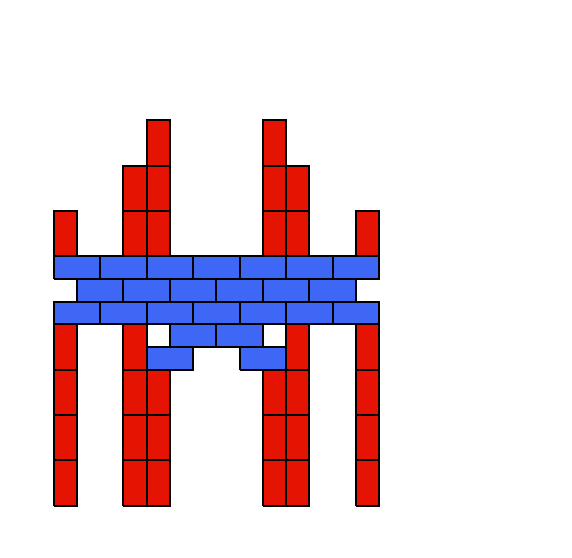

{'low_level_parts': ['pillar', 'pillar', 'arch', 'pillar', 'pillar', 'arch', 'pillar', 'pillar', 'arch'], 'low_level_part_types': ['pillar', 'pillar', 'arch-6', 'pillar', 'pillar', 'arch-8', 'pillar', 'pillar', 'arch-6'], 'low_level_part_params': ['4', '4', '4', '4', '4', '4'], 'mid_level_parts': ['pillar-pair', 'arch', 'pillar-pair', 'arch', 'pillar-pair', 'arch'], 'mid_level_part_types': ['pillar-pair', 'arch-6', 'pillar-pair', 'arch-8', 'pillar-pair', 'arch-6'], 'mid_level_part_params': ['4', '6', '4', '8', '4', '6'], 'high_level_parts': ['arch-set-parameterized'], 'high_level_part_types': ['arch-set-6-8-6'], 'high_level_part_params': ['4', '4']}


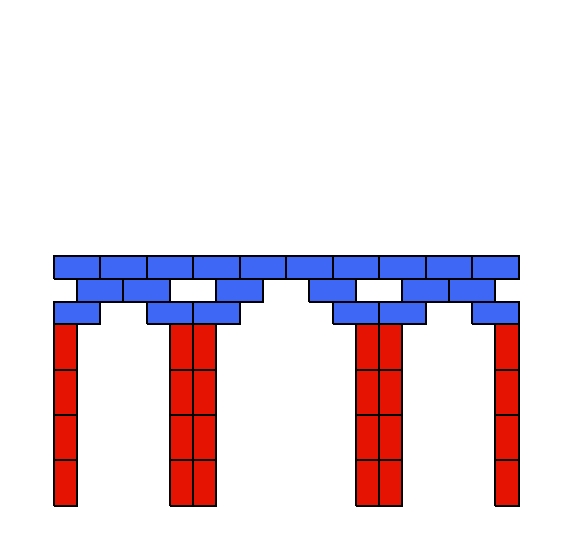

{'low_level_parts': ['pillar', 'pillar', 'arch', 'pillar', 'pillar', 'arch', 'row', 'pillar', 'pillar', 'pillar', 'pillar'], 'low_level_part_types': ['pillar', 'pillar', 'arch-6', 'pillar', 'pillar', 'arch-6', 'row-thin', 'pillar', 'pillar', 'pillar', 'pillar'], 'low_level_part_params': ['2', '2', '2', '2', '1', '1', '1', '1'], 'mid_level_parts': ['pillar-pair', 'arch', 'pillar-pair', 'arch', 'viaduct', 'suspension'], 'mid_level_part_types': ['pillar-pair', 'arch-6', 'pillar-pair', 'arch-6', 'viaduct', 'suspension-uniform'], 'mid_level_part_params': ['2', '6', '2', '6', '1'], 'high_level_parts': ['arch-set-parameterized', 'viaduct', 'suspension'], 'high_level_part_types': ['viaduct', 'suspension-uniform', 'arch-set-6-6'], 'high_level_part_params': ['2', '1']}


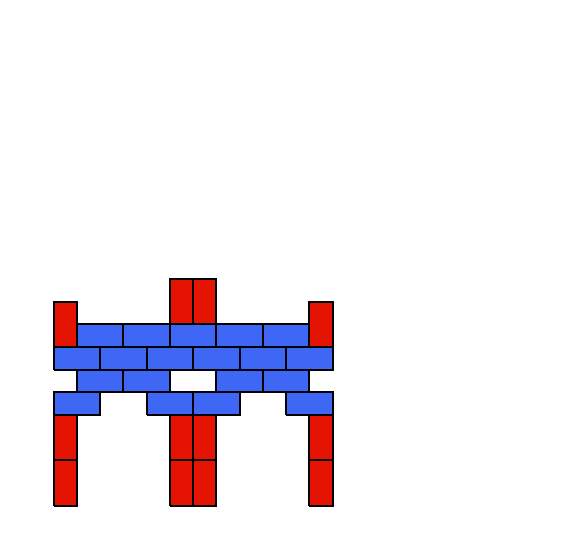

{'low_level_parts': ['pillar', 'pillar', 'arch', 'pillar', 'pillar', 'arch', 'row', 'row', 'pillar', 'pillar', 'pillar', 'pillar'], 'low_level_part_types': ['pillar', 'pillar', 'arch-4', 'pillar', 'pillar', 'arch-4', 'row-thin', 'row-thick', 'pillar', 'pillar', 'pillar', 'pillar'], 'low_level_part_params': ['4', '4', '4', '4', '1', '1', '2', '2'], 'mid_level_parts': ['pillar-pair', 'arch', 'pillar-pair', 'arch', 'viaduct', 'pillar-pair', 'pillar-pair'], 'mid_level_part_types': ['pillar-pair', 'arch-4', 'pillar-pair', 'arch-4', 'viaduct', 'pillar-pair', 'pillar-pair'], 'mid_level_part_params': ['4', '4', '4', '4', '2', '7', '1', '1', '2'], 'high_level_parts': ['arch-set-parameterized', 'viaduct', 'suspension'], 'high_level_part_types': ['viaduct', 'suspension-highmiddle', 'arch-set-4-4'], 'high_level_part_params': ['4', '2']}


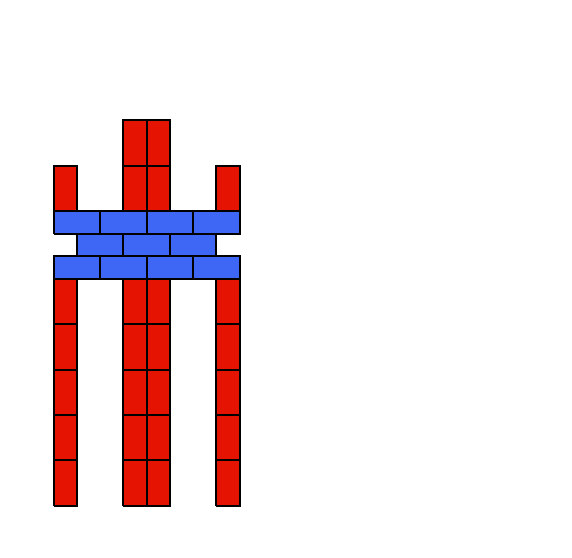

{'low_level_parts': ['pillar', 'pillar', 'arch', 'pillar', 'pillar', 'arch', 'pillar', 'pillar', 'arch'], 'low_level_part_types': ['pillar', 'pillar', 'arch-4', 'pillar', 'pillar', 'arch-4', 'pillar', 'pillar', 'arch-4'], 'low_level_part_params': ['3', '3', '3', '3', '3', '3'], 'mid_level_parts': ['pillar-pair', 'arch', 'pillar-pair', 'arch', 'pillar-pair', 'arch'], 'mid_level_part_types': ['pillar-pair', 'arch-4', 'pillar-pair', 'arch-4', 'pillar-pair', 'arch-4'], 'mid_level_part_params': ['3', '4', '3', '4', '3', '4'], 'high_level_parts': ['arch-set-parameterized'], 'high_level_part_types': ['arch-set-4-4-4'], 'high_level_part_params': ['3']}


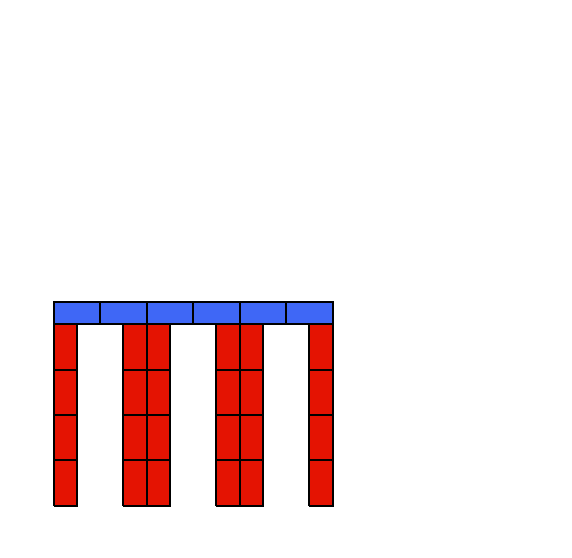

{'low_level_parts': ['pillar', 'pillar', 'arch', 'pillar', 'pillar', 'arch', 'pillar', 'pillar', 'arch', 'pillar', 'pillar', 'arch', 'pillar', 'pillar', 'arch', 'row', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar'], 'low_level_part_types': ['pillar', 'pillar', 'arch-4', 'pillar', 'pillar', 'arch-4', 'pillar', 'pillar', 'arch-4', 'pillar', 'pillar', 'arch-4', 'pillar', 'pillar', 'arch-4', 'row-thin', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar', 'pillar'], 'low_level_part_params': ['1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1'], 'mid_level_parts': ['pillar-pair', 'arch', 'pillar-pair', 'arch', 'pillar-pair', 'arch', 'pillar-pair', 'arch', 'pillar-pair', 'arch', 'viaduct', 'suspension'], 'mid_level_part_types': ['pillar-pair', 'arch-4', 'pillar-pair', 'arch-4', 'pillar-pair', 'arch-4', 'pillar-pair', 'arch-4', 'pillar-pair', 'arch-4', 'viad

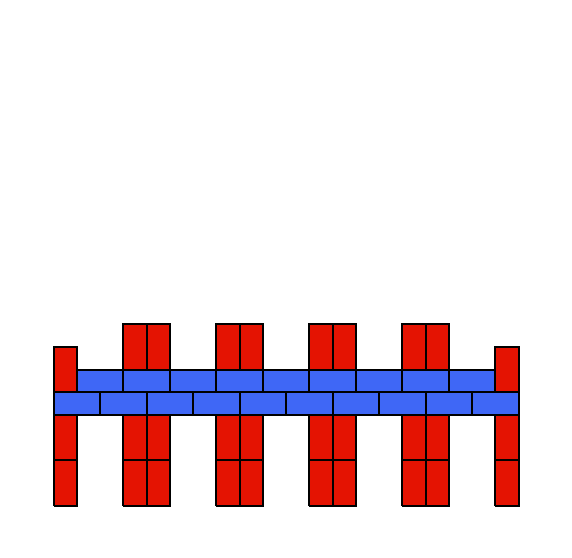

In [347]:
for i in range(0,len(df_bridges),100):
    w = new_world()
    w.place_tower(df_bridges.loc[i,'blocks'])
    print(df_bridges.loc[i,'top_down_abstractions'])
    fig = utils.draw_world(w)

### Cities

In [143]:
random.seed(RANDOM_SEED)

In [144]:
MAX_SKYSCRAPER_HEIGHT = 4
MIN_SKYSCRAPER_HEIGHT = 1

SKYSCRAPER_ROOFS = {'pyramids': pyramids,
#                     'slabs': slabs, # not used for cogsci22
                    'flats': flats}

REPEAT_OPTIONS = ['mirrored', 'repeated', 'single']

redo:

Each level is a complete description

- low: [4-blocks, rows]
- mid: [stacks, roof]
- mid-high: [walls, roof]
- high: [skyscraper]



In [145]:
skyscrapers = []
df_skyscrapers = pd.DataFrame()


for skyscraper_1_height in range(MIN_SKYSCRAPER_HEIGHT, MAX_SKYSCRAPER_HEIGHT+1):
    for i, t_1_brick in enumerate(tower_bricks_manual):

        t_1_brick_width = utils.worldify(t_1_brick).tower_width()

        for repeat_option in REPEAT_OPTIONS:

            for _, (roof_1_name, roof_1_type) in enumerate(SKYSCRAPER_ROOFS.items()):

                w = new_world()
                
                # add parts to lists to create 'programs' (these are already mostly saved)
                top_down_abstractions = init_abstractions()

                # Add skyscraper wall to program
                top_down_abstractions['high_level_parts'].append('skyscraper-wall')
                top_down_abstractions['high_level_part_types'].append('skyscraper-wall-'+str(i)+'-'+repeat_option) #HERE
                top_down_abstractions['high_level_part_params'].append(str(0))
                top_down_abstractions['high_level_part_params'].append(str(skyscraper_1_height))
                skyscraper_wall_width = 'wide' if repeat_option in ['mirrored','repeated'] else 'narrow'
                top_down_abstractions['high_level_part_params'].append(str(skyscraper_wall_width))

                # vertically stack bricks for tower one
                stack(w, t_1_brick, n=skyscraper_1_height, x_location=0)
                
                for n in range(0,skyscraper_1_height):
                    top_down_abstractions['low_level_parts'].append('4-block-brick')
                    top_down_abstractions['low_level_part_types'].append('4-block-brick-type-'+str(i))
                    
                if skyscraper_1_height > 1: 
                    top_down_abstractions['mid_level_parts'].append('stack')
                    top_down_abstractions['mid_level_part_types'].append('stack-brick-type-'+str(i))
                    top_down_abstractions['mid_level_part_params'].append(str(skyscraper_1_height))
                else:
                    top_down_abstractions['mid_level_parts'].append('4-block-brick')
                    top_down_abstractions['mid_level_part_types'].append('4-block-brick-type-'+str(i))

                if repeat_option == 'mirrored':
                    # repeat but mirrored
                    stack(w, mirror(t_1_brick), n=skyscraper_1_height, x_location=t_1_brick_width)
                    for n in range(0,skyscraper_1_height):
                        top_down_abstractions['low_level_parts'].append('4-block-brick')
                        top_down_abstractions['low_level_part_types'].append('4-block-brick-type-'+str(i)+'-mirrored')
                    top_down_abstractions['mid_level_parts'].append('mirror')
                    top_down_abstractions['mid_level_part_types'].append('mirror')
                    
                    # add roof
                    if roof_1_name != 'none':
                        wall_width = roof_1_type[t_1_brick_width*2]
                        w.place_tower(wall_width, 0)

                        # low level parts (rows)     
                        if roof_1_name == 'flats':
                            top_down_abstractions['low_level_parts'].append('row')
                            top_down_abstractions['low_level_part_types'].append('row')
                            top_down_abstractions['low_level_part_params'].append(str(t_1_brick_width))
                        elif roof_1_name == 'pyramids':
                            # add all row widths for pyramid
                            for row_i in range(1,t_1_brick_width+1):
                                top_down_abstractions['low_level_parts'].append('row') # add rows in pyramid
                                top_down_abstractions['low_level_part_types'].append('row')
                                top_down_abstractions['low_level_part_params'].append(str(row_i))
                        else:
                            print('unsupported roof type')
            
                        # mid level parts
                        top_down_abstractions['mid_level_parts'].append('roof')
                        top_down_abstractions['mid_level_part_types'].append('roof-type-'+roof_1_name)
                        top_down_abstractions['high_level_parts'].append('roof')
                        top_down_abstractions['high_level_part_types'].append('roof-type-'+roof_1_name)

                elif repeat_option == 'repeated':
                    # repeat
                    stack(w, t_1_brick, n=skyscraper_1_height, x_location=t_1_brick_width)
                    for n in range(0,skyscraper_1_height):
                        top_down_abstractions['low_level_parts'].append('4-block-brick')
                        top_down_abstractions['low_level_part_types'].append('4-block-brick-type-'+str(i))
                        
                    top_down_abstractions['mid_level_parts'].append('repeat')
                    top_down_abstractions['mid_level_part_types'].append('repeat')
                    top_down_abstractions['mid_level_part_params'].append(str(t_1_brick_width)) # where to put repeated stack
                    
                    # add roof
                    if roof_1_name != 'none':
                        wall_width = roof_1_type[t_1_brick_width*2]
                        w.place_tower(wall_width, 0)

                        # low level parts (rows)     
                        if roof_1_name == 'flats':
                            top_down_abstractions['low_level_parts'].append('row')
                            top_down_abstractions['low_level_part_types'].append('row')
                            top_down_abstractions['low_level_part_params'].append(str(t_1_brick_width))
                        elif roof_1_name == 'pyramids':
                            # add all row widths for pyramid
                            for row_i in range(1,t_1_brick_width+1):
                                top_down_abstractions['low_level_parts'].append('row') # add rows in pyramid
                                top_down_abstractions['low_level_part_types'].append('row')
                                top_down_abstractions['low_level_part_params'].append(str(row_i))
                        else:
                            print('unsupported roof type')
            
                        # mid level parts
                        top_down_abstractions['mid_level_parts'].append('roof')
                        top_down_abstractions['mid_level_part_types'].append('roof-type-'+roof_1_name)
                        top_down_abstractions['high_level_parts'].append('roof')
                        top_down_abstractions['high_level_part_types'].append('roof-type-'+roof_1_name)

                elif repeat_option == 'single':

                    # add roof
                    if roof_1_name != 'none':
                        wall_width = roof_1_type[t_1_brick_width]
                        w.place_tower(wall_width, 0)

                        # low level parts (rows)     
                        if roof_1_name == 'flats':
                            top_down_abstractions['low_level_parts'].append('row')
                            top_down_abstractions['low_level_part_types'].append('row')
                            top_down_abstractions['low_level_part_params'].append(str(t_1_brick_width/2))
                        elif roof_1_name == 'pyramids':
                            # add all row widths for pyramid
                            for row_i in range(1,int(t_1_brick_width/2)+1):
                                top_down_abstractions['low_level_parts'].append('row') # add rows in pyramid
                                top_down_abstractions['low_level_part_types'].append('row')
                                top_down_abstractions['low_level_part_params'].append(str(row_i))
                        else:
                            print('unsupported roof type')
            
                        # mid level parts
                        top_down_abstractions['mid_level_parts'].append('roof')
                        top_down_abstractions['mid_level_part_types'].append('roof-type-'+roof_1_name)
                        top_down_abstractions['high_level_parts'].append('roof')
                        top_down_abstractions['high_level_part_types'].append('roof-type-'+roof_1_name)

                else:
                    raise Exception("No such mirror option (\"{}\") supported".format(repeat_option))

        
                if not w.broken:
                    skyscrapers.append(w)
                    df_skyscrapers = df_skyscrapers.append(
                        {
                            'structure_type': 'skyscraper',
                            'blocks': w.get_block_dict()['blocks'],
                            'structure_width': w.tower_width(),
                            'structure_height': w.tower_height(),
                            'n_blocks': len(w.blocks),
                            'brick': t_1_brick,
                            'roof_name': roof_1_name,
                            'skyscraper_height':skyscraper_1_height,
                            'roof_size': wall_width,
                            'repeat_option': repeat_option,
                            'top_down_abstractions': top_down_abstractions,
                        }, ignore_index=True
                    )
                    
#                     assert(len(top_down_abstractions['high_level_parts']) == len(top_down_abstractions['high_level_part_types']))

print(str(len(skyscrapers)) + ' individual skyscrapers generated')


185 individual skyscrapers generated


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0-mirrored', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-0', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-0-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


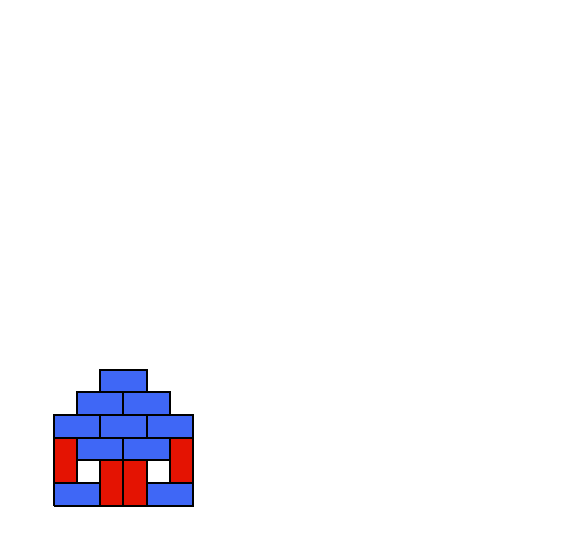

{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-0', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-0-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-0', 'row'], 'low_level_part_params': ['1'], 'mid_level_parts': ['4-block-brick', 'roof'], 'mid_level_part_types': ['4-block-brick-type-0', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-0-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-1', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-1', 'mirror', 'roof-type-flats'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-1', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-1', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-1', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['4-block-brick', 'roof'], 'mid_level_part_types': ['4-block-brick-type-1', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-2', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-2', 'mirror', 'roof-type-flats'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-2', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-2', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['4-block-brick', 'roof'], 'mid_level_part_types': ['4-block-brick-type-2', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-3', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-3', 'mirror', 'roof-type-flats'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-3', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-3', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-3', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['4-block-brick', 'roof'], 'mid_level_part_types': ['4-block-brick-type-3', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-4', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-4', 'mirror', 'roof-type-flats'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-4', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-4', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['4-block-brick', 'roof'], 'mid_level_part_types': ['4-block-brick-type-4', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-5', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-5', 'mirror', 'roof-type-flats'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-5', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-5', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-5', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['4-block-brick', 'roof'], 'mid_level_part_types': ['4-block-brick-type-5', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-6', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-6', 'mirror', 'roof-type-flats'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-6', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-6', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-6', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['4-block-brick', 'roof'], 'mid_level_part_types': ['4-block-brick-type-6', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-7', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-7', 'mirror', 'roof-type-flats'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-7', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-7', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-7', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['4-block-brick', 'roof'], 'mid_level_part_types': ['4-block-brick-type-7', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-8', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


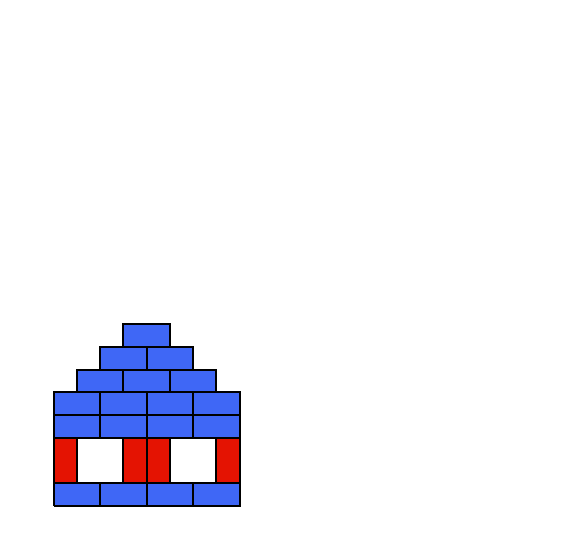

{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-8', 'mirror', 'roof-type-flats'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-8', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


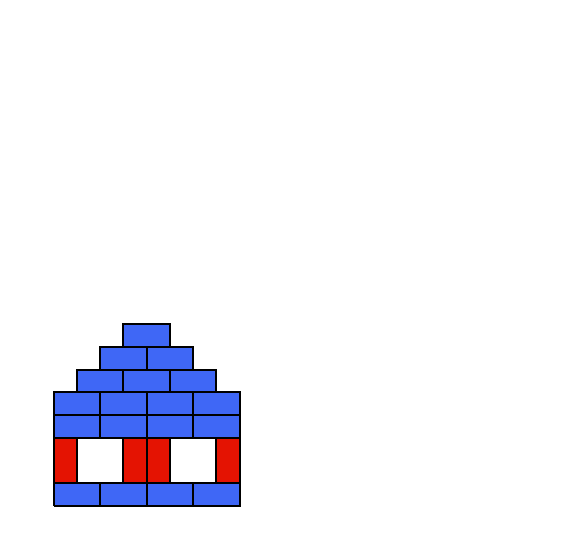

{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-8', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-8', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['4-block-brick', 'roof'], 'mid_level_part_types': ['4-block-brick-type-8', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'narrow']}


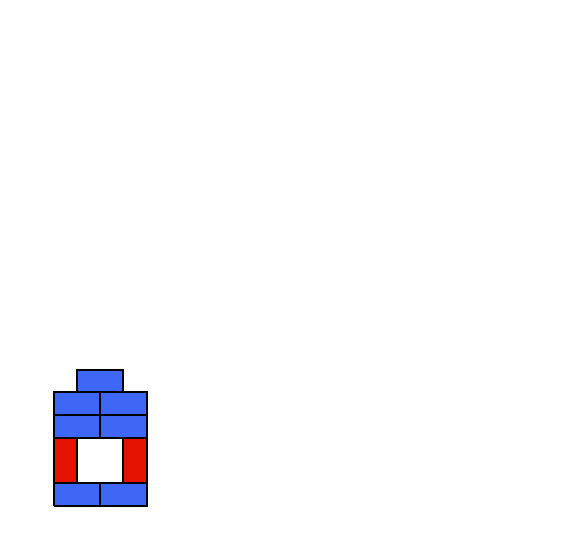

{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-9', '4-block-brick-type-9-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-9', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-9-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-9', '4-block-brick-type-9-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'], 'mid_level_part_types': ['4-block-brick-type-9', 'mirror', 'roof-type-flats'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-9-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-9', '4-block-brick-type-9', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-9', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-9-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-9', '4-block-brick-type-9', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['4-block-brick', 'repeat', 'roof'], 'mid_level_part_types': ['4-block-brick-type-9', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-9-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '1', 'wide']}


{'low_level_parts': ['4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-9', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['4-block-brick', 'roof'], 'mid_level_part_types': ['4-block-brick-type-9', 'roof-type-pyramids'], 'mid_level_part_params': [], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-9-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '1', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-0', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-0-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-0', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['2', '3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-0-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0', 'row'], 'low_level_part_params': ['1'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-0', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-0-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7-mirrored', '4-block-brick-type-7-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7-mirrored', '4-block-brick-type-7-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


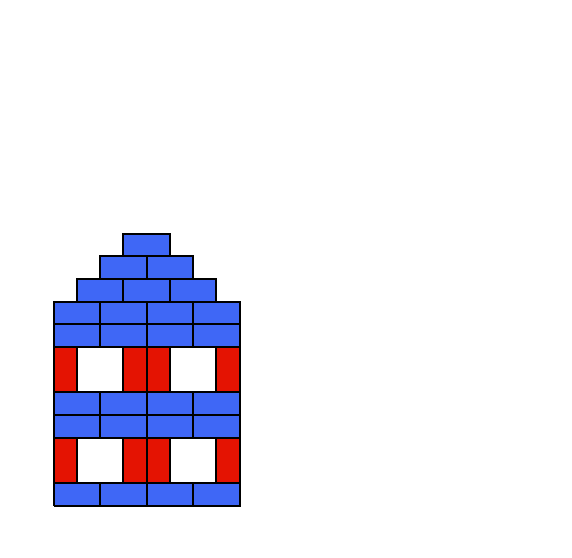

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


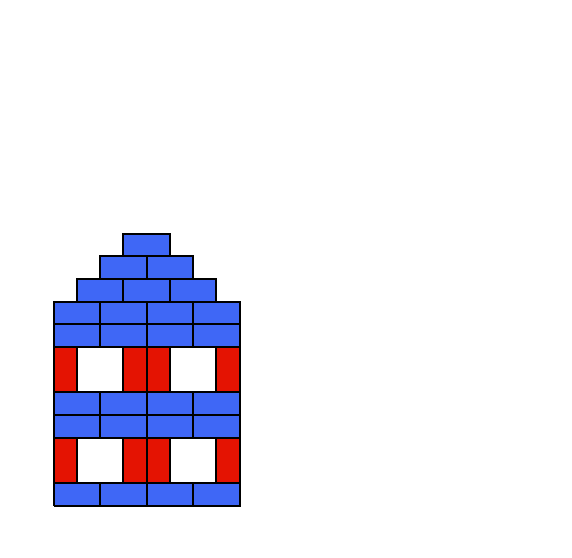

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'narrow']}


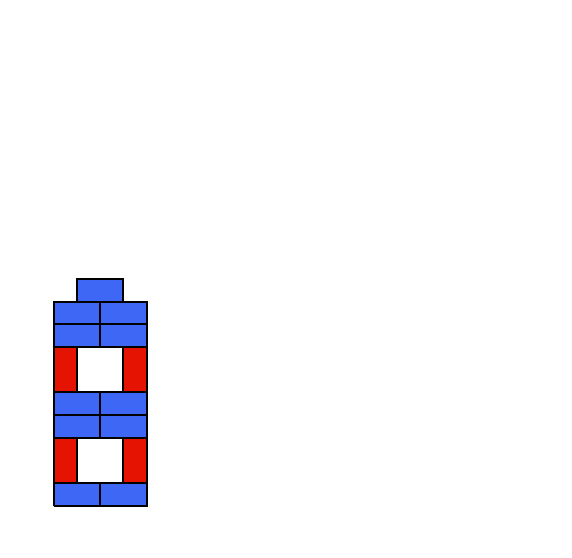

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9-mirrored', '4-block-brick-type-9-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-9', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-9-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9-mirrored', '4-block-brick-type-9-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-9', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-9-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-9', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-9-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-9', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-9-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '2', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-9', '4-block-brick-type-9', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-9', 'roof-type-pyramids'], 'mid_level_part_params': ['2'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-9-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '2', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-0', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-0-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-0', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['3', '3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-0-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', 'row'], 'low_level_part_params': ['1'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-0', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-0-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7-mirrored', '4-block-brick-type-7-mirrored', '4-block-brick-type-7-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7-mirrored', '4-block-brick-type-7-mirrored', '4-block-brick-type-7-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9-mirrored', '4-block-brick-type-9-mirrored', '4-block-brick-type-9-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-9', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-9-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-9', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['3', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-9-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '3', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-9', 'roof-type-pyramids'], 'mid_level_part_params': ['3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-9-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '3', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-0', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-0-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-0', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4', '3'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-0-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', 'row'], 'low_level_part_params': ['1'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-0', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-0-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-1-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-2-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-3-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-4-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-5-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-6-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7-mirrored', '4-block-brick-type-7-mirrored', '4-block-brick-type-7-mirrored', '4-block-brick-type-7-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7-mirrored', '4-block-brick-type-7-mirrored', '4-block-brick-type-7-mirrored', '4-block-brick-type-7-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', '4-block-brick-type-7', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-7', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-7-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'narrow']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'mirror', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-mirrored', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'mirror', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'mirror', 'roof-type-flats'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-mirrored', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'repeat', 'roof-type-pyramids'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-repeated', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', 'row'], 'low_level_part_params': ['4'], 'mid_level_parts': ['stack', 'repeat', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'repeat', 'roof-type-flats'], 'mid_level_part_params': ['4', '4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-repeated', 'roof-type-flats'], 'high_level_part_params': ['0', '4', 'wide']}


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'roof-type-pyramids'], 'mid_level_part_params': ['4'], 'high_level_parts': ['skyscraper-wall', 'roof'], 'high_level_part_types': ['skyscraper-wall-8-single', 'roof-type-pyramids'], 'high_level_part_params': ['0', '4', 'narrow']}


In [146]:
for i in df_skyscrapers.index:
    w = new_world()
    w.place_tower(df_skyscrapers.loc[i,'blocks'])
    print(df_skyscrapers.loc[i,'top_down_abstractions'])
    fig = utils.draw_world(w)

In [147]:
df_skyscrapers.top_down_abstractions[0]

{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', 'row'],
 'low_level_part_types': ['4-block-brick-type-0',
  '4-block-brick-type-0-mirrored',
  'row',
  'row',
  'row'],
 'low_level_part_params': ['1', '2', '3'],
 'mid_level_parts': ['4-block-brick', 'mirror', 'roof'],
 'mid_level_part_types': ['4-block-brick-type-0',
  'mirror',
  'roof-type-pyramids'],
 'mid_level_part_params': [],
 'high_level_parts': ['skyscraper-wall', 'roof'],
 'high_level_part_types': ['skyscraper-wall-0-mirrored', 'roof-type-pyramids'],
 'high_level_part_params': ['0', '1', 'wide']}

In [148]:
MIN_SKYSCRAPER_GAP = 1
MAX_SKYSCRAPER_GAP = 2

In [149]:
cities = []
df_cities = pd.DataFrame()

for i, s1 in df_skyscrapers.iterrows():
    for j, s2 in df_skyscrapers.iterrows():
        for gap in range(MIN_SKYSCRAPER_GAP, MAX_SKYSCRAPER_GAP+1):
            
            top_down_abstractions = {} # merge abstractions from individual towers
            top_down_abstractions['low_level_parts'] = s1.top_down_abstractions['low_level_parts'] + s2.top_down_abstractions['low_level_parts']
            top_down_abstractions['low_level_part_types'] = s1.top_down_abstractions['low_level_part_types'] + s2.top_down_abstractions['low_level_part_types']
            top_down_abstractions['low_level_part_params'] = s1.top_down_abstractions['low_level_part_params'] + s2.top_down_abstractions['low_level_part_params']
            top_down_abstractions['mid_level_parts'] = s1.top_down_abstractions['mid_level_parts'] + s2.top_down_abstractions['mid_level_parts']
            top_down_abstractions['mid_level_part_types'] = s1.top_down_abstractions['mid_level_part_types'] + s2.top_down_abstractions['mid_level_part_types']
            top_down_abstractions['mid_level_part_params'] = s1.top_down_abstractions['mid_level_part_params'] + s2.top_down_abstractions['mid_level_part_params']
            top_down_abstractions['high_level_parts'] = s1.top_down_abstractions['high_level_parts'] + s2.top_down_abstractions['high_level_parts']
            top_down_abstractions['high_level_part_types'] = s1.top_down_abstractions['high_level_part_types'] + s2.top_down_abstractions['high_level_part_types']
            top_down_abstractions['high_level_part_params'] = s1.top_down_abstractions['high_level_part_params'] + s2.top_down_abstractions['high_level_part_params']
            top_down_abstractions['tower_level_parts'] = []
            top_down_abstractions['tower_level_part_types'] = [] 
            top_down_abstractions['tower_level_part_params'] = []
            
            w = new_world()
            # place first skyscraper
            w = w.place_tower(s1.blocks, 0)
            top_down_abstractions['tower_level_parts'].append('skyscraper')
            top_down_abstractions['tower_level_part_types'].append('skyscraper-type-'+str(i))
            
            #place other skyscraper at position relative to first
            w.place_tower(s2.blocks, x_location = int(s1.structure_width+gap))
            top_down_abstractions['tower_level_parts'].append('skyscraper')
            top_down_abstractions['tower_level_part_types'].append('skyscraper-type-'+str(j))       
            
            if not w.broken:
                cities.append(w)
                df_cities = df_cities.append(
                    {
                        'structure_type': 'city',
                        'blocks': w.get_block_dict()['blocks'],
                        'structure_width': w.tower_width(),
                        'structure_height': w.tower_height(),
                        'n_blocks': len(w.blocks),
                        't_1_brick': s1.brick,
                        't_2_brick': s2.brick,
                        'gap': gap,
                        'roof_1_name': s1.roof_name,
                        'roof_2_name': s2.roof_name,
                        'skyscraper_1_height': s1.skyscraper_height,
                        'skyscraper_2_height': s2.skyscraper_height,
                        'top_down_abstractions':top_down_abstractions,
                        'low_level_parts' : top_down_abstractions['low_level_parts'],
                        'low_level_part_types' : top_down_abstractions['low_level_part_types'],
                        'low_level_part_params' : top_down_abstractions['low_level_part_params'],
                        'mid_level_parts' : top_down_abstractions['mid_level_parts'],
                        'mid_level_part_types' : top_down_abstractions['mid_level_part_types'],
                        'mid_level_part_params' : top_down_abstractions['mid_level_part_params'],
                        'high_level_parts' : top_down_abstractions['high_level_parts'],
                        'high_level_part_types' : top_down_abstractions['high_level_part_types'],
                        'high_level_part_params' : top_down_abstractions['high_level_part_params'],
                        'tower_level_parts' : top_down_abstractions['tower_level_parts'],
                        'tower_level_part_types' : top_down_abstractions['tower_level_part_types'],
                        'tower_level_part_params' : top_down_abstractions['tower_level_part_params']
                    }, ignore_index=True
                )

print(str(len(cities)) + ' pairs of skyscrapers generated')

68450 pairs of skyscrapers generated


## Enumerate Houses

In [10]:
# random.seed(RANDOM_SEED)

In [45]:
HOUSE_WIDTHS = [1,2,3]
HOUSE_HEIGHTS = [1,2,3]

TILE_WIDTH = 4
TILE_HEIGHT = 4

MIN_DOOR = 0
MAX_DOOR = 2

HOUSE_ROOFS = {'pyramids': pyramids}

FIRST_STORY_COMPONENTS = [DOOR,
                            SMALL_WINDOW,
                            HOUSE_BRICKS]

OTHER_STORY_COMPONENTS = [SMALL_WINDOW,
                            HOUSE_BRICKS]

In [53]:
FIRST_STORY_COMPONENTS = {'DOOR':DOOR,
                            'SMALL_WINDOW':SMALL_WINDOW,
                            'HOUSE_BRICKS':HOUSE_BRICKS}

OTHER_STORY_COMPONENTS = {'SMALL_WINDOW': SMALL_WINDOW,
                           'HOUSE_BRICKS': HOUSE_BRICKS}

In [54]:
# get all permutations of components

# ground floors can include doors
first_stories = {}
for house_width in HOUSE_WIDTHS:
    repeated_components = [list(FIRST_STORY_COMPONENTS.keys())] * house_width
    first_stories[house_width] = list(product(*repeated_components))


# non-ground floors don't included doors
other_stories = {}
for house_width in HOUSE_WIDTHS:
    repeated_components = [list(OTHER_STORY_COMPONENTS.keys())] * house_width
    other_stories[house_width] = list(product(*repeated_components))

In [15]:
def floor_tuple_to_floor_world(tiles):
    '''
    Helper function to convert json to world object
    '''
    w = new_world()
    for i, tile in enumerate(tiles):
        w.place_tower_relative(tile)
        
    return w

In [302]:
random.seed(RANDOM_SEED)

houses = []
df_houses = pd.DataFrame()

generation_probability = 1.0

for house_width in HOUSE_WIDTHS:
        
    first_stories_of_width = [
                    {'blocks': [FIRST_STORY_COMPONENTS[tile] for tile in story],
                     'world': floor_tuple_to_floor_world([FIRST_STORY_COMPONENTS[tile] for tile in story]),
                     'tiles': story,
                     'story_id':str(s_id)}
                              for s_id, story in enumerate(first_stories[house_width])]
    
    other_stories_of_width = [
                    {'blocks': [FIRST_STORY_COMPONENTS[tile] for tile in story],
                     'world': floor_tuple_to_floor_world([FIRST_STORY_COMPONENTS[tile] for tile in story]),
                     'tiles': story,
                     'story_id':str(s_id)}
                              for s_id, story in enumerate(other_stories[house_width])]
        
    for _, (roof_name, roof_type) in enumerate(HOUSE_ROOFS.items()):

        # one story
        for s_1 in first_stories_of_width:
            
            structure_generation_probability = generation_probability * 0.9 ** (house_width)

            w = new_world()
            w.place_tower(s_1['world'].get_block_dict()['blocks']) # add story
            
            top_down_abstractions = init_abstractions()
            top_down_abstractions['low_level_parts'] += s_1['tiles']
            top_down_abstractions['low_level_part_types'] += s_1['tiles']
            top_down_abstractions['mid_level_parts'].append('story')
            top_down_abstractions['mid_level_part_types'].append('story-'+s_1['story_id']) # add type?
            top_down_abstractions['mid_level_part_params'].append(str(int(house_width)))
            top_down_abstractions['high_level_parts'].append('house')
            top_down_abstractions['high_level_part_types'].append('house-'+s_1['story_id'])
#             top_down_abstractions['high_level_part_params'].append(house_width) # width of house
#             top_down_abstractions['high_level_part_params'].append(str(1)) # n floors
            
            w.place_tower(roof_type[house_width*4]) # add roof
            
            for row_i in range(1,int(house_width*4/2)+1):
                top_down_abstractions['low_level_parts'].append('row') # add rows in pyramid
                top_down_abstractions['low_level_part_types'].append('row')
                top_down_abstractions['low_level_part_params'].append(str(int(row_i)))
                
            top_down_abstractions['mid_level_parts'].append('roof')
            top_down_abstractions['mid_level_part_types'].append('roof-pyramid')
            top_down_abstractions['mid_level_part_params'].append(str(int(house_width*4/2)))
            
            top_down_abstractions['high_level_parts'].append('roof')
            top_down_abstractions['high_level_part_types'].append('roof-pyramid')
            top_down_abstractions['high_level_part_params'].append(str(int(house_width*4/2)))

            if (not(w.broken)) & (random.uniform(0, 1) < structure_generation_probability):
                    houses.append(w)
                    df_houses = df_houses.append(
                        {
                            'structure_type': 'house',
                            'blocks': w.get_block_dict()['blocks'],
                            'structure_width': w.tower_width(),
                            'structure_height': w.tower_height(),
                            'n_blocks': len(w.blocks),
                            'house_width': house_width,
                            'n_stories': 1,
                            'roof_name': roof_name,
                            'top_down_abstractions':top_down_abstractions,
                            'low_level_parts' : top_down_abstractions['low_level_parts'],
                            'low_level_part_types' : top_down_abstractions['low_level_part_types'],
                            'low_level_part_params' : top_down_abstractions['low_level_part_params'],
                            'mid_level_parts' : top_down_abstractions['mid_level_parts'],
                            'mid_level_part_types' : top_down_abstractions['mid_level_part_types'],
                            'mid_level_part_params' : top_down_abstractions['mid_level_part_params'],
                            'high_level_parts' : top_down_abstractions['high_level_parts'],
                            'high_level_part_types' : top_down_abstractions['high_level_part_types'],
                            'high_level_part_params' : top_down_abstractions['high_level_part_params']
                        }, ignore_index=True
                        )

        # two story
        for s_1 in first_stories_of_width:
            for s_2 in other_stories_of_width:
                
                structure_generation_probability = generation_probability * 0.9 ** (2 ** house_width)

                w = new_world()
                w.place_tower(s_1['world'].get_block_dict()['blocks'])
                
                top_down_abstractions = init_abstractions()
                top_down_abstractions['low_level_parts'] += s_1['tiles']
                top_down_abstractions['low_level_part_types'] += s_1['tiles']
                top_down_abstractions['mid_level_parts'].append('story')
                top_down_abstractions['mid_level_part_types'].append('story-'+s_1['story_id']) # add type?
                top_down_abstractions['mid_level_part_params'].append(str(int(house_width)))
                top_down_abstractions['high_level_parts'].append('house')
                top_down_abstractions['high_level_part_types'].append('house-'+s_1['story_id']+'-'+s_2['story_id'])
#                 top_down_abstractions['high_level_part_params'].append(house_width) # width of house
#                 top_down_abstractions['high_level_part_params'].append(str(2)) # n floors

                w.place_tower(s_2['world'].get_block_dict()['blocks'])
                
                top_down_abstractions['low_level_parts'] += s_2['tiles']
                top_down_abstractions['low_level_part_types'] += s_2['tiles']
                top_down_abstractions['mid_level_parts'].append('story')
                top_down_abstractions['mid_level_part_types'].append('story-'+s_2['story_id']) # add type?
                top_down_abstractions['mid_level_part_params'].append(str(int(house_width)))
                
                w.place_tower(roof_type[house_width*4])
                
                for row_i in range(1,int(house_width*4/2)+1):
                    top_down_abstractions['low_level_parts'].append('row') # add rows in pyramid
                    top_down_abstractions['low_level_part_types'].append('row')
                    top_down_abstractions['low_level_part_params'].append(str(int(row_i)))

                top_down_abstractions['mid_level_parts'].append('roof')
                top_down_abstractions['mid_level_part_types'].append('roof-pyramid')
                top_down_abstractions['mid_level_part_params'].append(str(int(house_width*4/2)))

                top_down_abstractions['high_level_parts'].append('roof')
                top_down_abstractions['high_level_part_types'].append('roof-pyramid')
                top_down_abstractions['high_level_part_params'].append(str(int(house_width*4/2)))

                if (not(w.broken)) & (random.uniform(0, 1) < structure_generation_probability):
                    houses.append(w)
                    df_houses = df_houses.append(
                        {
                            'structure_type': 'house',
                            'blocks': w.get_block_dict()['blocks'],
                            'structure_width': w.tower_width(),
                            'structure_height': w.tower_height(),
                            'n_blocks': len(w.blocks),
                            'house_width': house_width,
                            'n_stories': 2,
                            'roof_name': roof_name,
                            'top_down_abstractions':top_down_abstractions,
                            'low_level_parts' : top_down_abstractions['low_level_parts'],
                            'low_level_part_types' : top_down_abstractions['low_level_part_types'],
                            'low_level_part_params' : top_down_abstractions['low_level_part_params'],
                            'mid_level_parts' : top_down_abstractions['mid_level_parts'],
                            'mid_level_part_types' : top_down_abstractions['mid_level_part_types'],
                            'mid_level_part_params' : top_down_abstractions['mid_level_part_params'],
                            'high_level_parts' : top_down_abstractions['high_level_parts'],
                            'high_level_part_types' : top_down_abstractions['high_level_part_types'],
                            'high_level_part_params' : top_down_abstractions['high_level_part_params']
                        }, ignore_index=True
                    )
    
        # three story
        for s_1 in first_stories_of_width:
            for s_2 in other_stories_of_width:
                for s_3 in other_stories_of_width:
                    
                    structure_generation_probability = generation_probability * 0.9 ** (3 ** house_width)

                    w = new_world()
                    w.place_tower(s_1['world'].get_block_dict()['blocks'])
                    
                    top_down_abstractions = init_abstractions()
                    top_down_abstractions['low_level_parts'] += s_1['tiles']
                    top_down_abstractions['low_level_part_types'] += s_1['tiles']
                    top_down_abstractions['mid_level_parts'].append('story')
                    top_down_abstractions['mid_level_part_types'].append('story-'+s_1['story_id']) # add type?
                    top_down_abstractions['mid_level_part_params'].append(str(int(house_width)))
                    top_down_abstractions['high_level_parts'].append('house')
                    top_down_abstractions['high_level_part_types'].append('house-'+s_1['story_id']+'-'+s_2['story_id']+'-'+s_3['story_id'])
#                     top_down_abstractions['high_level_part_params'].append(house_width) # width of house
#                     top_down_abstractions['high_level_part_params'].append(str(3)) # n floors
                    
                    w.place_tower(s_2['world'].get_block_dict()['blocks'])
                
                    top_down_abstractions['low_level_parts'] += s_2['tiles']
                    top_down_abstractions['low_level_part_types'] += s_2['tiles']
                    top_down_abstractions['mid_level_parts'].append('story')
                    top_down_abstractions['mid_level_part_types'].append('story-'+s_2['story_id']) # add type?
                    top_down_abstractions['mid_level_part_params'].append(str(int(house_width)))
                
                    w.place_tower(s_3['world'].get_block_dict()['blocks'])
                    
                    top_down_abstractions['low_level_parts'] += s_3['tiles']
                    top_down_abstractions['low_level_part_types'] += s_3['tiles']
                    top_down_abstractions['mid_level_parts'].append('story')
                    top_down_abstractions['mid_level_part_types'].append('story-'+s_3['story_id']) # add type?
                    top_down_abstractions['mid_level_part_params'].append(str(int(house_width)))
                    
                    w.place_tower(roof_type[house_width*4])

                    for row_i in range(1,int(house_width*4/2)+1):
                        top_down_abstractions['low_level_parts'].append('row') # add rows in pyramid
                        top_down_abstractions['low_level_part_types'].append('row')
                        top_down_abstractions['low_level_part_params'].append(str(row_i))

                    top_down_abstractions['mid_level_parts'].append('roof')
                    top_down_abstractions['mid_level_part_types'].append('roof-pyramid')
                    top_down_abstractions['mid_level_part_params'].append(str(int(house_width*4/2)))

                    top_down_abstractions['high_level_parts'].append('roof')
                    top_down_abstractions['high_level_part_types'].append('roof-pyramid')
                    top_down_abstractions['high_level_part_params'].append(str(int(house_width*4/2)))

                    if (not(w.broken)) & (random.uniform(0, 1) < structure_generation_probability):
                        houses.append(w)
                        df_houses = df_houses.append(
                        {
                            'structure_type': 'house',
                            'blocks': w.get_block_dict()['blocks'],
                            'structure_width': w.tower_width(),
                            'structure_height': w.tower_height(),
                            'n_blocks': len(w.blocks),
                            'house_width': house_width,
                            'n_stories': 3,
                            'roof_name': roof_name,
                            'top_down_abstractions':top_down_abstractions,
                            'low_level_parts' : top_down_abstractions['low_level_parts'],
                            'low_level_part_types' : top_down_abstractions['low_level_part_types'],
                            'low_level_part_params' : top_down_abstractions['low_level_part_params'],
                            'mid_level_parts' : top_down_abstractions['mid_level_parts'],
                            'mid_level_part_types' : top_down_abstractions['mid_level_part_types'],
                            'mid_level_part_params' : top_down_abstractions['mid_level_part_params'],
                            'high_level_parts' : top_down_abstractions['high_level_parts'],
                            'high_level_part_types' : top_down_abstractions['high_level_part_types'],
                            'high_level_part_params' : top_down_abstractions['high_level_part_params']
                        }, ignore_index=True
                        )
                        
print(str(len(houses)) + ' houses generated')

333 houses generated


{'low_level_parts': ['HOUSE_BRICKS', 'HOUSE_BRICKS', 'HOUSE_BRICKS', 'row', 'row'], 'low_level_part_types': ['HOUSE_BRICKS', 'HOUSE_BRICKS', 'HOUSE_BRICKS', 'row', 'row'], 'low_level_part_params': ['1', '2'], 'mid_level_parts': ['story', 'story', 'story', 'roof'], 'mid_level_part_types': ['story-2', 'story-1', 'story-1', 'roof-pyramid'], 'mid_level_part_params': ['1', '1', '1', '2'], 'high_level_parts': ['house', 'roof'], 'high_level_part_types': ['house-2-1-1', 'roof-pyramid'], 'high_level_part_params': ['2']}
14


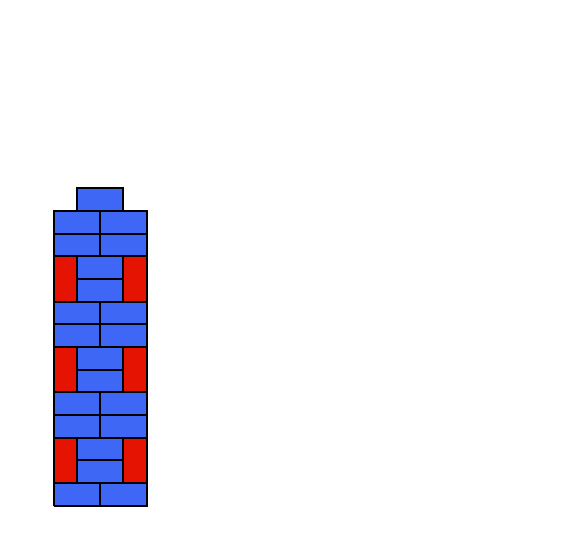

{'low_level_parts': ['DOOR', 'DOOR', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['DOOR', 'DOOR', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['story', 'roof'], 'mid_level_part_types': ['story-0', 'roof-pyramid'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['house', 'roof'], 'high_level_part_types': ['house-0', 'roof-pyramid'], 'high_level_part_params': ['4']}
15


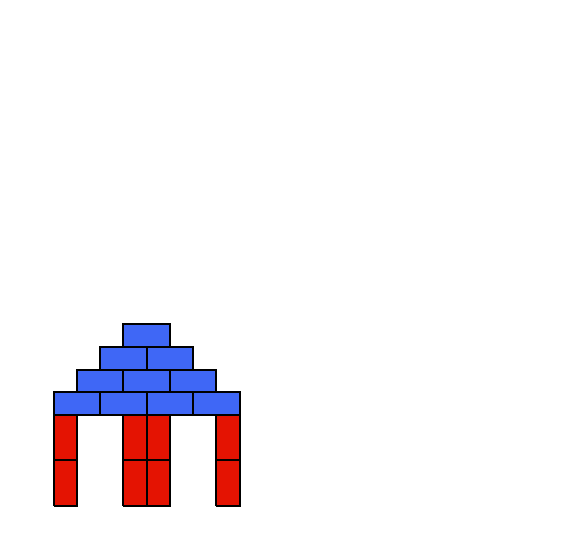

{'low_level_parts': ['DOOR', 'HOUSE_BRICKS', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['DOOR', 'HOUSE_BRICKS', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['story', 'roof'], 'mid_level_part_types': ['story-2', 'roof-pyramid'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['house', 'roof'], 'high_level_part_types': ['house-2', 'roof-pyramid'], 'high_level_part_params': ['4']}
16


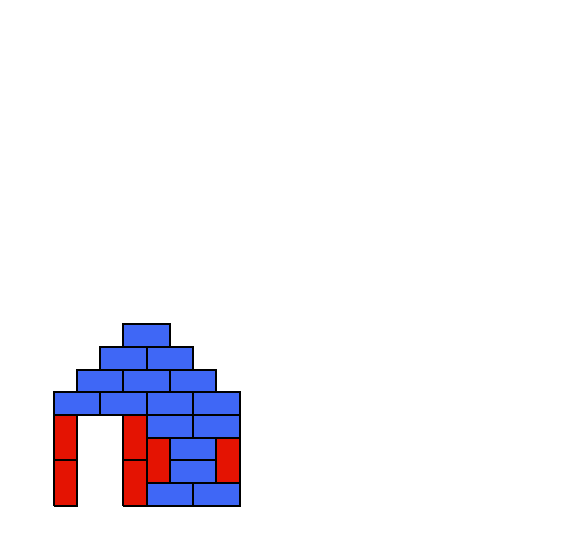

{'low_level_parts': ['SMALL_WINDOW', 'DOOR', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['SMALL_WINDOW', 'DOOR', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['story', 'roof'], 'mid_level_part_types': ['story-3', 'roof-pyramid'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['house', 'roof'], 'high_level_part_types': ['house-3', 'roof-pyramid'], 'high_level_part_params': ['4']}
17


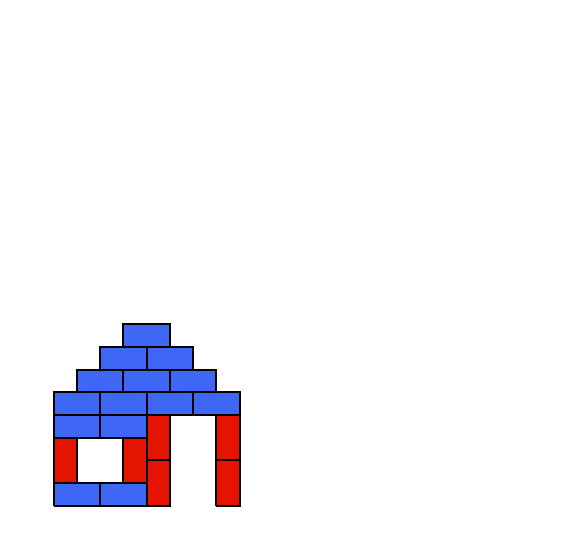

{'low_level_parts': ['SMALL_WINDOW', 'SMALL_WINDOW', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['SMALL_WINDOW', 'SMALL_WINDOW', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['story', 'roof'], 'mid_level_part_types': ['story-4', 'roof-pyramid'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['house', 'roof'], 'high_level_part_types': ['house-4', 'roof-pyramid'], 'high_level_part_params': ['4']}
18


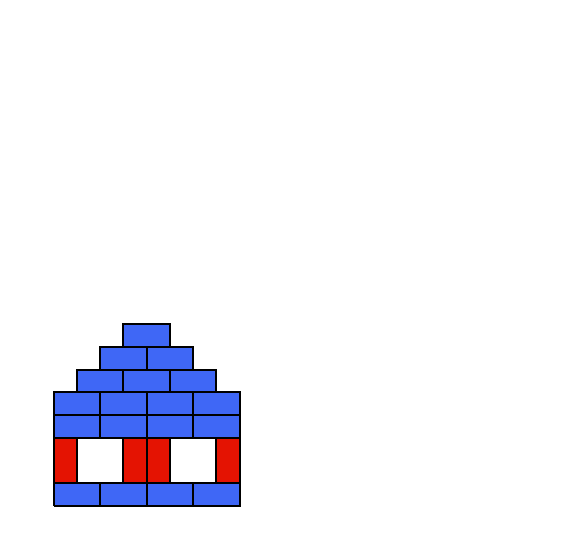

{'low_level_parts': ['SMALL_WINDOW', 'HOUSE_BRICKS', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['SMALL_WINDOW', 'HOUSE_BRICKS', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['story', 'roof'], 'mid_level_part_types': ['story-5', 'roof-pyramid'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['house', 'roof'], 'high_level_part_types': ['house-5', 'roof-pyramid'], 'high_level_part_params': ['4']}
19


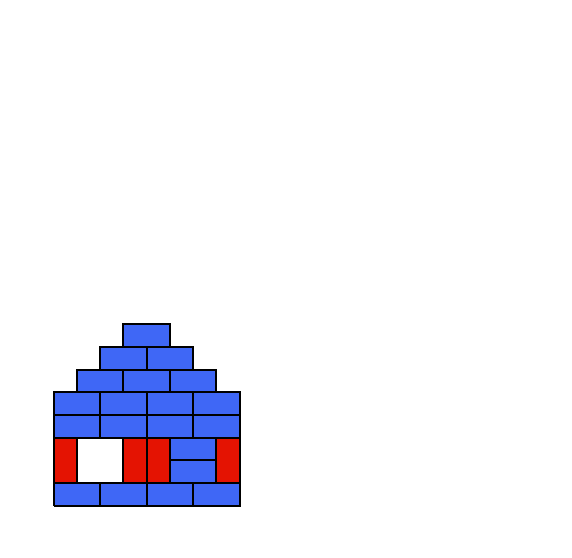

{'low_level_parts': ['HOUSE_BRICKS', 'DOOR', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['HOUSE_BRICKS', 'DOOR', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['story', 'roof'], 'mid_level_part_types': ['story-6', 'roof-pyramid'], 'mid_level_part_params': ['2', '4'], 'high_level_parts': ['house', 'roof'], 'high_level_part_types': ['house-6', 'roof-pyramid'], 'high_level_part_params': ['4']}
20


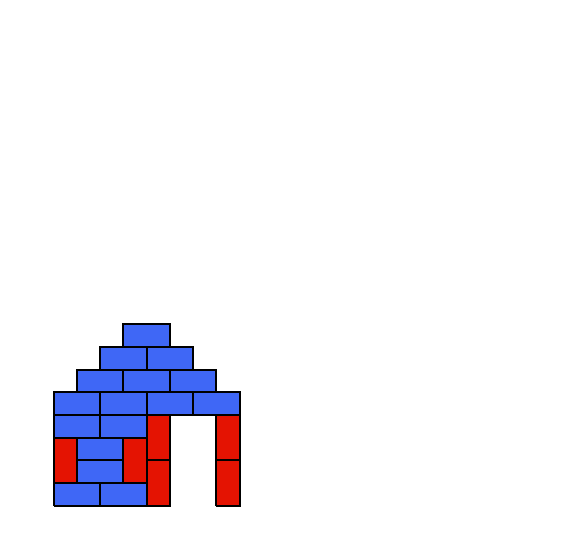

{'low_level_parts': ['DOOR', 'DOOR', 'SMALL_WINDOW', 'SMALL_WINDOW', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['DOOR', 'DOOR', 'SMALL_WINDOW', 'SMALL_WINDOW', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['story', 'story', 'roof'], 'mid_level_part_types': ['story-0', 'story-0', 'roof-pyramid'], 'mid_level_part_params': ['2', '2', '4'], 'high_level_parts': ['house', 'roof'], 'high_level_part_types': ['house-0-0', 'roof-pyramid'], 'high_level_part_params': ['4']}
21


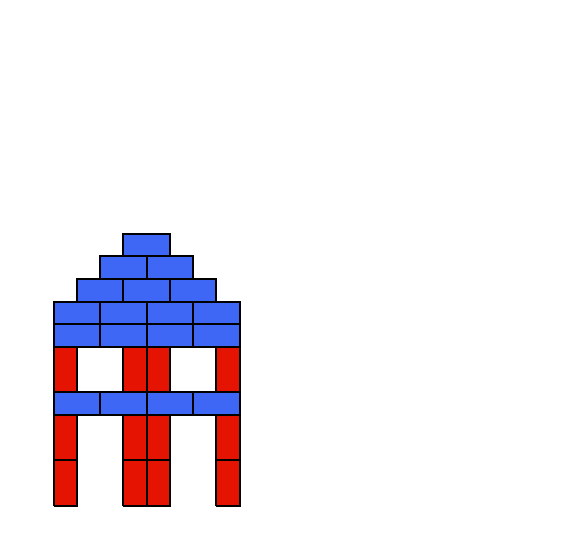

{'low_level_parts': ['DOOR', 'DOOR', 'HOUSE_BRICKS', 'SMALL_WINDOW', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['DOOR', 'DOOR', 'HOUSE_BRICKS', 'SMALL_WINDOW', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['story', 'story', 'roof'], 'mid_level_part_types': ['story-0', 'story-2', 'roof-pyramid'], 'mid_level_part_params': ['2', '2', '4'], 'high_level_parts': ['house', 'roof'], 'high_level_part_types': ['house-0-2', 'roof-pyramid'], 'high_level_part_params': ['4']}
22


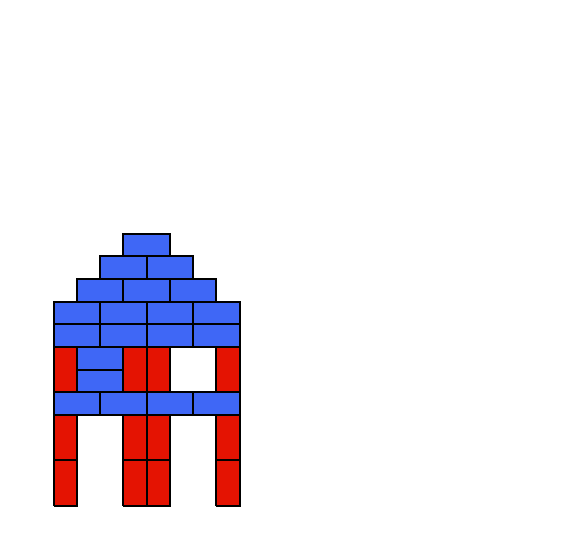

{'low_level_parts': ['DOOR', 'SMALL_WINDOW', 'SMALL_WINDOW', 'SMALL_WINDOW', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['DOOR', 'SMALL_WINDOW', 'SMALL_WINDOW', 'SMALL_WINDOW', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['story', 'story', 'roof'], 'mid_level_part_types': ['story-1', 'story-0', 'roof-pyramid'], 'mid_level_part_params': ['2', '2', '4'], 'high_level_parts': ['house', 'roof'], 'high_level_part_types': ['house-1-0', 'roof-pyramid'], 'high_level_part_params': ['4']}
23


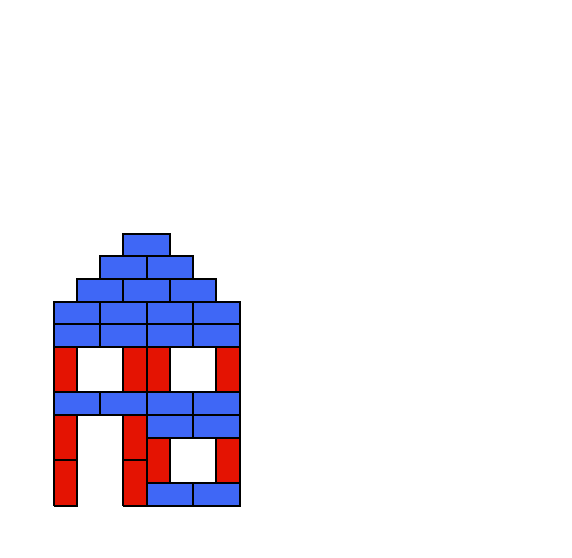

{'low_level_parts': ['DOOR', 'SMALL_WINDOW', 'SMALL_WINDOW', 'HOUSE_BRICKS', 'row', 'row', 'row', 'row'], 'low_level_part_types': ['DOOR', 'SMALL_WINDOW', 'SMALL_WINDOW', 'HOUSE_BRICKS', 'row', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '3', '4'], 'mid_level_parts': ['story', 'story', 'roof'], 'mid_level_part_types': ['story-1', 'story-1', 'roof-pyramid'], 'mid_level_part_params': ['2', '2', '4'], 'high_level_parts': ['house', 'roof'], 'high_level_part_types': ['house-1-1', 'roof-pyramid'], 'high_level_part_params': ['4']}
24


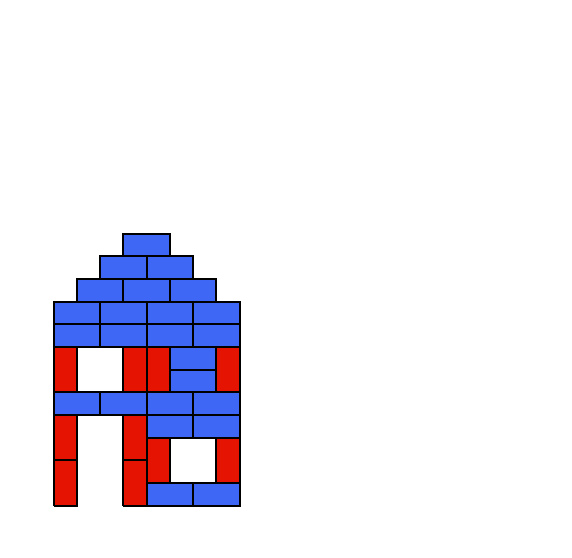

In [303]:
for i in range(14,25):
    w = new_world()
    w.place_tower(df_houses.loc[i,'blocks'])
    print(df_houses.loc[i,'top_down_abstractions'])
    print(i)
    fig = utils.draw_world(w)

## Enumerate Castles

- Bilateral symmetry
- Central wall constructed from one repeated 4-block motif (mirrored)
- Turrets constructed from one repeated 4-block motif (mirrored either side)
- Same style roof on turrets and center

In [131]:
random.seed(RANDOM_SEED)

In [132]:
MIN_CASTLE_WALL_HEIGHT = 1
MAX_CASTLE_WALL_HEIGHT = 4
CASTLE_WALL_SIZES = [2,4]


MIN_CASTLE_TOWER_HEIGHT = 1
MAX_CASTLE_TOWER_HEIGHT = 4

CASTLE_ROOFS = {'pyramid': pyramids,
         'dome': domes}

In [197]:
castles = []
df_castles = pd.DataFrame()

for wall_height in range(MIN_CASTLE_WALL_HEIGHT, MAX_CASTLE_WALL_HEIGHT + 1):
    
    # outer towers must be shorter 
    for tower_height in range(MIN_CASTLE_TOWER_HEIGHT, MAX_CASTLE_TOWER_HEIGHT + 1):
        
        for wall_size in CASTLE_WALL_SIZES:
            
             for wb_id, wall_brick in enumerate(tower_bricks_manual):
                    
                    for  tb_id, tower_brick in enumerate(tower_bricks_manual):
                        
                        for _, (roof_name, roof_type) in enumerate(CASTLE_ROOFS.items()):
                            
                            structure_generation_probability = 1.0

                            w = new_world() #castle object
                            top_down_abstractions = init_abstractions()

                            #tower world object
                            tower_w = new_world()
                            tower_w = stack(tower_w, tower_brick, tower_height)
                            tower_width = tower_w.tower_width()
                            tower = tower_w.get_block_dict()['blocks']
                            
                            top_down_abstractions['high_level_parts'].append('tower')
                            top_down_abstractions['high_level_part_types'].append('tower-brick-type-'+str(tb_id)+'-'+str(roof_name))
                            top_down_abstractions['high_level_part_params'].append(str(tower_height))
                            
                            for n in range(0,tower_height):
                                top_down_abstractions['low_level_parts'].append('4-block-brick')
                                top_down_abstractions['low_level_part_types'].append('4-block-brick-type-'+str(tb_id))
                            
                            if tower_height > 1: 
                                top_down_abstractions['mid_level_parts'].append('stack')
                                top_down_abstractions['mid_level_part_types'].append('stack-brick-type-'+str(tb_id))
                                top_down_abstractions['mid_level_part_params'].append(str(tower_height))
                            else:
                                top_down_abstractions['mid_level_parts'].append('4-block-brick')
                                top_down_abstractions['mid_level_part_types'].append('4-block-brick-type-'+str(tb_id))

                            #wall world object
                            wall_column_w = new_world()
                            wall_column_w = stack(wall_column_w, wall_brick, wall_height)
                            wall_column_width = wall_column_w.tower_width()
                            wall_column = wall_column_w.get_block_dict()['blocks']

                            # place left tower
                            w.place_tower_relative(tower)

                            # add roof to left tower
                            if tower_width >= 4:
                                w.place_tower(roof_type[tower_width])
                                
                                # do different things if pyramid or dome
                                if roof_name == 'dome': # add shorter row below pyramid that makes a dome
                                    top_down_abstractions['low_level_parts'].append('row') # add rows in pyramid
                                    top_down_abstractions['low_level_part_types'].append('row')
                                    top_down_abstractions['low_level_part_params'].append(str(tower_width-3))
                                    
                                for row_i in range(1,int(tower_width)-1): # Add pyramid 
                                    top_down_abstractions['low_level_parts'].append('row') # add rows in pyramid
                                    top_down_abstractions['low_level_part_types'].append('row')
                                    top_down_abstractions['low_level_part_params'].append(str((int(tower_width)-1)-row_i))

                                top_down_abstractions['mid_level_parts'].append('roof')
                                top_down_abstractions['mid_level_part_types'].append(roof_name)
                                top_down_abstractions['mid_level_part_params'].append(str(int(tower_width)-2))


                            # construct wall
                            
                            top_down_abstractions['high_level_parts'].append('wall')
                            top_down_abstractions['high_level_part_types'].append('wall-brick-type-'+str(wb_id)+'-mirrored')
                            top_down_abstractions['high_level_part_params'].append(str(wall_height))
                            top_down_abstractions['high_level_part_params'].append(str(wall_size))
                            
                            for i in range(0,int(wall_size/2)):
                                w.place_tower_relative(wall_column)

                                for n in range(0,wall_height):
                                    top_down_abstractions['low_level_parts'].append('4-block-brick')
                                    top_down_abstractions['low_level_part_types'].append('4-block-brick-type-'+str(wb_id))

                                if wall_height > 1: 
                                    top_down_abstractions['mid_level_parts'].append('stack')
                                    top_down_abstractions['mid_level_part_types'].append('stack-brick-type-'+str(wb_id))
                                    top_down_abstractions['mid_level_part_params'].append(str(wall_height))
                                else:
                                    top_down_abstractions['mid_level_parts'].append('4-block-brick')
                                    top_down_abstractions['mid_level_part_types'].append('4-block-brick-type-'+str(wb_id))


                            for i in range(0,int(wall_size/2)):
                                w.place_tower_relative(mirror(wall_column))
                                
                                for n in range(0,wall_height):
                                    top_down_abstractions['low_level_parts'].append('4-block-brick')
                                    top_down_abstractions['low_level_part_types'].append('4-block-brick-type-'+str(wb_id)+'-mirrored')

                                if wall_height > 1: 
                                    top_down_abstractions['mid_level_parts'].append('stack')
                                    top_down_abstractions['mid_level_part_types'].append('stack-brick-type-'+str(wb_id)+'-mirrored')
                                    top_down_abstractions['mid_level_part_params'].append(str(wall_height))
                                else:
                                    top_down_abstractions['mid_level_parts'].append('4-block-brick')
                                    top_down_abstractions['mid_level_part_types'].append('4-block-brick-type-'+str(wb_id)+'-mirrored')

                            wall_width = wall_column_width*wall_size

                            # add roof to wall
                            w.place_tower(roof_type[wall_width], tower_width)
                            
                            # do different things if pyramid or dome
                            if roof_name == 'dome': # add shorter row below pyramid that makes a dome
                                top_down_abstractions['low_level_parts'].append('row') # add rows in pyramid
                                top_down_abstractions['low_level_part_types'].append('row')
                                top_down_abstractions['low_level_part_params'].append(str(int(wall_width/2)-1)) #CHECK

                            for row_i in range(1,int(wall_width/2)+1): # Add pyramid 
                                top_down_abstractions['low_level_parts'].append('row') # add rows in pyramid
                                top_down_abstractions['low_level_part_types'].append('row')
                                top_down_abstractions['low_level_part_params'].append(str((int(wall_width/2)+1)-row_i))

                            top_down_abstractions['mid_level_parts'].append('roof')
                            top_down_abstractions['mid_level_part_types'].append(roof_name)
                            top_down_abstractions['mid_level_part_params'].append(str(int(wall_width/2)-1))


                            # place right tower
                            w.place_tower_relative(mirror(tower))
                            
                            top_down_abstractions['high_level_parts'].append('tower')
                            top_down_abstractions['high_level_part_types'].append('tower-brick-type-'+str(wb_id))
                            
                            for n in range(0,tower_height):
                                top_down_abstractions['low_level_parts'].append('4-block-brick')
                                top_down_abstractions['low_level_part_types'].append('4-block-brick-type-'+str(tb_id)+'-mirrored')
                            
                            if tower_height > 1: 
                                top_down_abstractions['mid_level_parts'].append('stack')
                                top_down_abstractions['mid_level_part_types'].append('stack-brick-type-'+str(tb_id)+'-mirrored')
                                top_down_abstractions['mid_level_part_params'].append(str(tower_height))
                            else:
                                top_down_abstractions['mid_level_parts'].append('4-block-brick')
                                top_down_abstractions['mid_level_part_types'].append('4-block-brick-type-'+str(tb_id)+'-mirrored')

                            # add roof to right tower
                            if tower_width >= 4:
                                w.place_tower(roof_type[tower_width], 
                                              tower_width + wall_width)
                                
                                # do different things if pyramid or dome 
                                if roof_name == 'dome': # add shorter row below pyramid that makes a dome
                                    top_down_abstractions['low_level_parts'].append('row') # add rows in pyramid
                                    top_down_abstractions['low_level_part_types'].append('row')
                                    top_down_abstractions['low_level_part_params'].append(str(tower_width-3))
                                    
                                for row_i in range(1,int(tower_width)-1): # Add pyramid 
                                    top_down_abstractions['low_level_parts'].append('row') # add rows in pyramid
                                    top_down_abstractions['low_level_part_types'].append('row')
                                    top_down_abstractions['low_level_part_params'].append(str((int(tower_width)-1)-row_i))

                                top_down_abstractions['mid_level_parts'].append('roof')
                                top_down_abstractions['mid_level_part_types'].append(roof_name)
                                top_down_abstractions['mid_level_part_params'].append(str(int(tower_width)-2))
                                
                            top_down_abstractions['high_level_parts'].append('roof-set')
                            top_down_abstractions['high_level_part_types'].append('roof-'+str(roof_name))
                                
                            # avoid particularly evocative towers
                            if (w.tower_height() > 13) and (tower_height < 3) and \
                            ((roof_name=='dome') or ((roof_name=='none') and (tower_width==3))):
                                structure_generation_probability = 0.0
                            

                            if (not(w.broken)) & (random.uniform(0,1) < structure_generation_probability):
                                castles.append(w)
                                df_castles = df_castles.append(
                                    {
                                        'structure_type': 'castle',
                                        'blocks': w.get_block_dict()['blocks'],
                                        'structure_width': w.tower_width(),
                                        'structure_height': w.tower_height(),
                                        'n_blocks': len(w.blocks),
                                        'wall_height': wall_height,
                                        'wall_size': wall_size,
                                        'wall_brick': wall_brick,
                                        'tower_brick': tower_brick,
                                        'tower_height': tower_height,
                                        'roof_name': roof_name,
                                        'central_roof_size': wall_width,
                                        'tower_roof_size': tower_width,
                                        'top_down_abstractions':top_down_abstractions,
                                        'low_level_parts' : top_down_abstractions['low_level_parts'],
                                        'low_level_part_types' : top_down_abstractions['low_level_part_types'],
                                        'low_level_part_params' : top_down_abstractions['low_level_part_params'],
                                        'mid_level_parts' : top_down_abstractions['mid_level_parts'],
                                        'mid_level_part_types' : top_down_abstractions['mid_level_part_types'],
                                        'mid_level_part_params' : top_down_abstractions['mid_level_part_params'],
                                        'high_level_parts' : top_down_abstractions['high_level_parts'],
                                        'high_level_part_types' : top_down_abstractions['high_level_part_types'],
                                        'high_level_part_params' : top_down_abstractions['high_level_part_params']
                                    }, ignore_index=True
                                )
    #                             fig = utils.draw_world(w)
    #                             n_towers += 1

print(str(len(castles)) + ' castles generated')

2778 castles generated


In [150]:
change 4-block-brick to tile

SyntaxError: invalid syntax (<ipython-input-150-c841cc616387>, line 1)

In [198]:
for i in range(0,len(castles),131):
    w = new_world()
    w.place_tower(df_castles.loc[i,'blocks'])
    print(df_castles.loc[i,'top_down_abstractions'])
    print(i)
    fig = utils.draw_world(w)

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', '4-block-brick'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0-mirrored', 'row', 'row', 'row', '4-block-brick-type-0-mirrored'], 'low_level_part_params': ['3', '2', '1'], 'mid_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'roof', '4-block-brick'], 'mid_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0-mirrored', 'pyramid', '4-block-brick-type-0-mirrored'], 'mid_level_part_params': ['2'], 'high_level_parts': ['tower', 'wall', 'tower', 'roof-set'], 'high_level_part_types': ['tower-brick-type-0-pyramid', 'wall-brick-type-0-mirrored', 'tower-brick-type-0', 'roof-pyramid'], 'high_level_part_params': ['1', '1', '2']}
0


{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', 'row', '4-block-brick'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-7', '4-block-brick-type-7-mirrored', 'row', 'row', 'row', 'row', 'row', '4-block-brick-type-0-mirrored'], 'low_level_part_params': ['3', '4', '3', '2', '1'], 'mid_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'roof', '4-block-brick'], 'mid_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-7', '4-block-brick-type-7-mirrored', 'dome', '4-block-brick-type-0-mirrored'], 'mid_level_part_params': ['3'], 'high_level_parts': ['tower', 'wall', 'tower', 'roof-set'], 'high_level_part_types': ['tower-brick-type-0-dome', 'wall-brick-type-7-mirrored', 'tower-brick-type-7', 'roof-dome'], 'high_level_part_params': ['1', '1', '2']}
131


{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', 'row', 'row', '4-block-brick-type-3', '4-block-brick-type-3-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', 'row', 'row'], 'low_level_part_params': ['2', '1', '4', '3', '2', '1', '2', '1'], 'mid_level_parts': ['stack', 'roof', '4-block-brick', '4-block-brick', 'roof', 'stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'pyramid', '4-block-brick-type-3', '4-block-brick-type-3-mirrored', 'pyramid', 'stack-brick-type-2-mirrored', 'pyramid'], 'mid_level_part_params': ['2', '2', '3', '2', '2'], 'high_level_parts': ['tower', 'wall', 'tower', 'roof-set'], 'high_level_part_types': ['tower-brick-type-2-pyramid', 'wall-brick-type-3-mirrored', 'tower-brick-type-3', 'roof-pyramid'

{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', 'row', 'row', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', 'row', 'row', 'row', 'row', 'row', 'row', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', 'row', 'row'], 'low_level_part_params': ['2', '1', '6', '5', '4', '3', '2', '1', '2', '1'], 'mid_level_parts': ['stack', 'roof', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'roof', 'stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'pyramid', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', 'pyramid', 'stack-brick-type-1-mirrored', 'pyramid'], 'mid_level_par

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', 'row', 'row', '4-block-brick-type-6', '4-block-brick-type-6-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', 'row', 'row'], 'low_level_part_params': ['2', '1', '4', '3', '2', '1', '2', '1'], 'mid_level_parts': ['stack', 'roof', '4-block-brick', '4-block-brick', 'roof', 'stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'pyramid', '4-block-brick-type-6', '4-block-brick-type-6-mirrored', 'pyramid', 'stack-brick-type-2-mirrored', 'pyramid'], 'mid_level_part_params': ['3', '2', '3', '3', '2'], 'high_level_parts': ['tower', 'wall', 'tower', 'roof-set'], 'high_level_part_types': ['towe

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', 'row', 'row', '4-block-brick-type-2', '4-block-brick-type-2-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', 'row', 'row'], 'low_level_part_params': ['2', '1', '4', '3', '2', '1', '2', '1'], 'mid_level_parts': ['stack', 'roof', '4-block-brick', '4-block-brick', 'roof', 'stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'pyramid', '4-block-brick-type-2', '4-block-brick-type-2-mirrored', 'pyramid', 'stack-brick-type-4-mirrored', 'pyramid'], 'mid_level_part_params': ['4', '2', '3', '4', '2'], 

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', 'row', 'row', 'row', '4-block-brick-type-9', '4-block-brick-type-9-mirrored', 'row', 'row', 'row', 'row', 'row', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '1', '3', '4', '3', '2', '1', '1', '2', '1'], 'mid_level_parts': ['stack', 'roof', '4-block-brick', '4-block-brick', 'roof', 'stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-6', 'dome', '4-block-brick-type-9', '4-block-brick-type-9-mirrored', 'dome', 'stack-brick-type-6-mirrored', 'dome'], 'mid

{'low_level_parts': ['4-block-brick', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-9', 'row', 'row', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-9-mirrored', 'row', 'row'], 'low_level_part_params': ['2', '1', '4', '3', '2', '1', '2', '1'], 'mid_level_parts': ['4-block-brick', 'roof', 'stack', 'stack', 'roof', '4-block-brick', 'roof'], 'mid_level_part_types': ['4-block-brick-type-9', 'pyramid', 'stack-brick-type-5', 'stack-brick-type-5-mirrored', 'pyramid', '4-block-brick-type-9-mirrored', 'pyramid'], 'mid_level_part_params': ['2', '2', '2', '3', '2'], 'high_level_parts': ['tower', 'wall', 'tower', 'roof-set'], 'high_level_part_types': ['tower-brick-type-9-pyramid', 'wall-brick-type-5-mirrored', 'tower-brick-type-5', 'roof-pyramid'

{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-5', '4-block-brick-type-5', 'row', 'row', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', 'row', 'row'], 'low_level_part_params': ['2', '1', '4', '3', '2', '1', '2', '1'], 'mid_level_parts': ['stack', 'roof', 'stack', 'stack', 'roof', 'stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-5', 'pyramid', 'stack-brick-type-2', 'stack-brick-type-2-mirrored', 'pyramid', 'stack-brick-type-5-mirrored', 'pyramid'], 'mid_level_part_params': ['2', '2', '2', '2', '3', '2', '2'], 'high_level_parts': ['tower', 'wall', 'tower', 'roof-set'], 'high_level_part_types': ['tower-brick-ty

{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-8', '4-block-brick-type-8', 'row', 'row', '4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9-mirrored', '4-block-brick-type-9-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', 'row', 'row'], 'low_level_part_params': ['2', '1', '4', '3', '2', '1', '2', '1'], 'mid_level_parts': ['stack', 'roof', 'stack', 'stack', 'roof', 'stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-8', 'pyramid', 'stack-brick-type-9', 'stack-brick-type-9-mirrored', 'pyramid', 'stack-brick-type-8-mirrored', 'pyramid'], 'mid_level_part_params': ['2', '2', '2', '2', '3', '2', '2'], 'high_level_parts': ['tower', 'wall', 'tower', 'roof-set'], 'high_level_part_types': ['tower-brick-ty

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored'], 'low_level_part_params': ['4', '3', '2', '1'], 'mid_level_parts': ['stack', 'stack', 'stack', 'roof', 'stack'], 'mid_level_part_types': ['stack-brick-type-0', 'stack-brick-type-6', 'stack-brick-type-6-mirrored', 'pyramid', 'stack-brick-type-0-mirrored'], 'mid_level_part_params': ['3', '2', '2', '3', '3'], 'high_level_parts': ['tower', 'wall', 'tower', 'roof-set'], 'high_level_part_types': ['tower-brick-type-0-pyramid', 'wall-brick-type-6

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', 'row', 'row', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', 'row', 'row'], 'low_level_part_params': ['2', '1', '4', '3', '2', '1', '2', '1'], 'mid_level_parts': ['stack', 'roof', 'stack', 'stack', 'roof', 'stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-2', 'pyramid', 'stack-brick-type-2', 'stack-brick-type-2-mirrored', 'pyramid', 'stack-brick-type-2-mirr

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', 'row', 'row', 'row', '4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9-mirrored', '4-block-brick-type-9-mirrored', 'row', 'row', 'row', 'row', 'row', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '1', '3', '4', '3', '2', '1', '1', '2', '1'], 'mid_level_parts': ['stack', 'roof', 'stack', 'stack', 'roof', 'stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-4', 'dome', 'stack-brick-type-9', 'stack-brick

{'low_level_parts': ['4-block-brick', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', 'row', 'row', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-4-mirrored', 'row', 'row'], 'low_level_part_params': ['2', '1', '4', '3', '2', '1', '2', '1'], 'mid_level_parts': ['4-block-brick', 'roof', 'stack', 'stack', 'roof', '4-block-brick', 'roof'], 'mid_level_part_types': ['4-block-brick-type-4', 'pyramid', 'stack-brick-type-8', 'stack-brick-type-8-mirrored', 'pyramid', '4-block-brick-type-4-mirrored', 'pyramid'], 'mid_level_part_params': ['2', '3', '3', '3', '2'], 'high_level_parts': ['tower', 'wall', 'tower', 'roof-set'], 'high_level_part_types': ['towe

{'low_level_parts': ['4-block-brick', '4-block-brick', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-7', '4-block-brick-type-7', 'row', 'row', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', 'row', 'row', 'row', 'row', 'row', 'row', '4-block-brick-type-7-mirrored', '4-block-brick-type-7-mirrored', 'row', 'row'], 'low_level_part_params': ['2', '1', '6', '5', '4', '3', '2', '1', '2', '1'], 'mid_le

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-9', '4-block-brick-type-9', '4-block-brick-type-9', 'row', 'row', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-9-mirrored', '4-block-brick-type-9-mirrored', '4-block-brick-type-9-mirrored', 'row', 'row'], 'low_level_part_params': ['2', '1', '4', '3', '2', '1', '2', '1'], 'mid_level_parts': ['stack', 'roof', 'stack', 'stack', 'roof', 'stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-9', 'pyramid', 'stack-brick-type-6', 'stack-brick-type-6-mirrored', 'pyramid', 'stack-brick-type-9-mirr

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', '4-block-brick-type-3', 'row', 'row', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', '4-block-brick-type-3-mirrored', 'row', 'row'], 'low_level_part_params': ['2', '1', '4', '3', '2', '1', '2', '1'], 'mid_level_parts': ['stack', 'roof', 'stack', 'stack', 'roof', 'stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-3', 'pyramid

{'low_level_parts': ['4-block-brick', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-9', 'row', 'row', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', '4-block-brick-type-2-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-9-mirrored', 'row', 'row'], 'low_level_part_params': ['2', '1', '4', '3', '2', '1', '2', '1'], 'mid_level_parts': ['4-block-brick', 'roof', 'stack', 'stack', 'roof', '4-block-brick', 'roof'], 'mid_level_part_types': ['4-block-brick-type-9', 'pyramid', 'stack-brick-type-2', 'stack-brick-type-2-mirrored', 'pyramid', '4-block-brick-type-9-mirrored', 'pyramid'], 'mid_level_part_params': ['2', '4', '4', '3', '2'], 

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick'], 'low_level_part_types': ['4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', '4-block-brick-type-5-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored'], 'low_level_part_params': ['4', '3', '2', '1'], 'mid_level_parts': ['stack', 'stack', 'stack', 'roof', 'stack'], 'mid_level_part_types': ['stack-brick-type-0', 'stack-brick-type-5', 'stack-brick-type-5-mirrored', 'pyramid', 'stack-brick-type-0-mirrored'], 'mid_level_part_params': ['2', '4', '4', '3', '2'], 'high_level_parts': ['tower', 'wall', 'towe

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-1', '4-block-brick-type-1', '4-block-brick-type-1', 'row', 'row', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', '4-block-brick-type-1-mirrored', 'row', 'row'], 'low_level_part_params': ['2', '1', '4', '3', '2', '1', '2', '1'], 'mid_level_parts': ['stack', 'roof', 'stack', 'stack', 'roof', 'stack', 'roof'], 'mid_level_part_types': ['stack-brick-type-1', 'pyramid

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', '4-block-brick-type-6', 'row', 'row', 'row', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', '4-block-brick-type-0-mirrored', 'row', 'row', 'row', 'row', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', '4-block-brick-type-6-mirrored', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '1', '2', '3', '2', '1', '1', '2', '1'], 'mid_le

{'low_level_parts': ['4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row', 'row', 'row', '4-block-brick', '4-block-brick', '4-block-brick', '4-block-brick', 'row', 'row', 'row'], 'low_level_part_types': ['4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', '4-block-brick-type-4', 'row', 'row', 'row', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', '4-block-brick-type-8-mirrored', 'row', 'row', 'row', 'row', 'row', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', '4-block-brick-type-4-mirrored', 'row', 'row', 'row'], 'low_level_part_params': ['1', '2', '1', '3', '4', '3', '2', '1', '1',

## Sample structures (with programs)

In [150]:
# df_cities.to_csv('df_cities_with_topdown_programs_backup.csv')

In [114]:
import ast

In [263]:
df_cities = pd.read_csv('df_cities_with_topdown_programs_backup.csv')
# df_cities.loc[:,'blocks'] = df_cities.blocks.apply(ast.literal_eval)

In [268]:
# df_cities['blocks'][0:10000].apply(ast.literal_eval)

KeyboardInterrupt: 

In [348]:
subdomains = ['bridge', 'house', 'castle', 'city']

full_dfs = {
    'bridge': df_bridges,
    'house': df_houses,
    'castle': df_castles,
#     'city': df_cities
}

In [349]:
orders = {
    'bridge': ['includes_outer_arches', 'n_inner_arch', 'bridge_elevation', 'inner_width', 'structure_height'],
    'house': ['n_stories','house_width'],
    'castle': ['wall_height','wall_size','tower_height','roof_name'],
    'city': ['skyscraper_1_height', 'skyscraper_2_height', 'structure_height','gap']
}

#### subset 250 structure, order by quasi-complexity, assign to test or train

In [350]:
df_subsets = {}

for subdomain in ['bridge']:
    
    df_full = full_dfs[subdomain].copy()
    
    # add dreamcoder programs
    df_full['dreamcoder_program'] = df_full['blocks'].apply(lambda x: convert(x, whole_squares=False))
    df_full['program_whole_squares'] = \
            df_full['blocks'].apply(lambda x: convert(x, whole_squares=True))
    
    
    # sample
    df_subset = df_full.sample(frac=1, random_state=RANDOM_SEED)\
                                .head(250)


    # sort
    df_subset = df_subset.sort_values(orders[subdomain]).reset_index(drop=True)

    df_subset['structure_number'] = df_subset.index
    
    # test-train split

    train = df_subset.sample(frac=0.8, random_state=RANDOM_SEED) #random state is a seed value
    test = df_subset.drop(train.index)

    df_subset.loc[train.index,'train'] = True
    df_subset.loc[test.index,'train'] = False
    
    df_subsets[subdomain] = df_subset

In [312]:
df_subsets['house'].to_csv('df_house_topdown_abstractions.csv')

In [277]:
df_subsets['castle'].to_csv('df_castle_topdown_abstractions.csv')

In [278]:
df_subsets['bridge'].to_csv('df_bridge_topdown_abstractions.csv')

In [314]:
df_subsets['city'] = pd.read_csv('df_city_topdown_abstractions.csv')

In [ ]:
df_subsets[]

In [315]:
df_topdownabs = pd.DataFrame()
df_topdownabs = df_topdownabs.append(df_subsets['bridge'], ignore_index=True)
df_topdownabs = df_topdownabs.append(df_subsets['castle'], ignore_index=True)
df_topdownabs = df_topdownabs.append(df_subsets['city'], ignore_index=True)
df_topdownabs = df_topdownabs.append(df_subsets['house'], ignore_index=True)

In [359]:
df_topdownabs.to_csv('df_structures_topdownabs_consistent_abstractions.csv')

In [290]:
df_subsets['city']

,Unnamed: 0,Unnamed: 0.1,structure_type,blocks,structure_width,structure_height,n_blocks,t_1_brick,t_2_brick,gap,...,high_level_parts,high_level_part_types,high_level_part_params,tower_level_parts,tower_level_part_types,tower_level_part_params,dreamcoder_program,program_whole_squares,structure_number,train
0,0,0,city,"[{'x': 0, 'y': 0, 'height': 2, 'width': 1}, {'...",18.0,4.0,22.0,"[{'x': 0, 'y': 0, 'height': 2, 'width': 1}, {'...","[{'x': 1, 'y': 0, 'height': 1, 'width': 2}, {'...",2.0,...,"['skyscraper-wall', 'roof', 'skyscraper-wall',...","['skyscraper-wall-2-repeated', 'roof-type-flat...","['0', '1', 'wide', '0', '1', 'wide']","['skyscraper', 'skyscraper']","['skyscraper-type-11', 'skyscraper-type-26']",[],((l 1) t (r 6) t (l 5) h (r 4) h (r 3) t (r 6)...,(t (r 3) t (l 3) h (r 2) h (r 2) t (r 3) t (l ...,0,True
1,1,1,city,"[{'x': 1, 'y': 0, 'height': 1, 'width': 2}, {'...",13.0,5.0,22.0,"[{'x': 1, 'y': 0, 'height': 1, 'width': 2}, {'...","[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...",1.0,...,"['skyscraper-wall', 'roof', 'skyscraper-wall',...","['skyscraper-wall-5-single', 'roof-type-pyrami...","['0', '1', 'narrow', '0', '1', 'wide']","['skyscraper', 'skyscraper']","['skyscraper-type-27', 'skyscraper-type-39']",[],((r 2) h (l 2) h (r 4) h (l 4) h (r 4) h (l 2)...,((r 1) h (l 1) h (r 2) h (l 2) h (r 2) h (l 1)...,1,True
2,2,2,city,"[{'x': 0, 'y': 0, 'height': 2, 'width': 1}, {'...",13.0,5.0,19.0,"[{'x': 0, 'y': 0, 'height': 2, 'width': 1}, {'...","[{'x': 1, 'y': 0, 'height': 2, 'width': 1}, {'...",1.0,...,"['skyscraper-wall', 'roof', 'skyscraper-wall',...","['skyscraper-wall-2-single', 'roof-type-pyrami...","['0', '1', 'narrow', '0', '1', 'wide']","['skyscraper', 'skyscraper']","['skyscraper-type-12', 'skyscraper-type-4']",[],((l 1) t (r 6) t (l 5) h (r 4) h (l 4) h (r 4)...,(t (r 3) t (l 3) h (r 2) h (l 2) h (r 2) h (l ...,2,True
3,3,3,city,"[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...",11.0,6.0,21.0,"[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...","[{'x': 1, 'y': 0, 'height': 2, 'width': 1}, {'...",1.0,...,"['skyscraper-wall', 'roof', 'skyscraper-wall',...","['skyscraper-wall-0-mirrored', 'roof-type-pyra...","['0', '1', 'wide', '0', '1', 'narrow']","['skyscraper', 'skyscraper']","['skyscraper-type-0', 'skyscraper-type-7']",[],(h (r 3) t (l 4) t (r 3) h (r 6) h (l 3) t (r ...,(h (r 2) t (l 2) t (r 1) h (r 3) h (l 1) t (r ...,3,True
4,4,4,city,"[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...",15.0,6.0,26.0,"[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...","[{'x': 0, 'y': 0, 'height': 2, 'width': 1}, {'...",1.0,...,"['skyscraper-wall', 'roof', 'skyscraper-wall',...","['skyscraper-wall-0-repeated', 'roof-type-pyra...","['0', '1', 'wide', '0', '1', 'wide']","['skyscraper', 'skyscraper']","['skyscraper-type-1', 'skyscraper-type-11']",[],(h (r 3) t (l 4) t (r 3) h (r 4) h (r 3) t (l ...,(h (r 2) t (l 2) t (r 1) h (r 2) h (r 2) t (l ...,4,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,245,245,city,"[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...",10.0,18.0,62.0,"[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...","[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...",2.0,...,"['skyscraper-wall', 'roof', 'skyscraper-wall',...","['skyscraper-wall-7-single', 'roof-type-pyrami...","['0', '4', 'narrow', '0', '4', 'narrow']","['skyscraper', 'skyscraper']","['skyscraper-type-179', 'skyscraper-type-174']",[],(h h (r 1) t (l 2) t (r 6) t (l 2) t (r 1) h h...,(h h (r 1) t (l 1) t (r 3) t (l 1) t h h (l 2)...,245,True
246,246,246,city,"[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...",14.0,18.0,63.0,"[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...","[{'x': 0, 'y': 0, 'height': 1, 'width': 2}, {'...",2.0,...,"['skyscraper-wall', 'roof', 'skyscraper-wall',...","['skyscraper-wall-8-single', 'roof-type-pyrami...","['0', '4', 'narrow', '0', '4', 'wide']","['skyscraper', 'skyscraper']","['skyscraper-type-184', 'skyscraper-type-161']",[],(h (r 4) h (l 5) t (r 6) t (l 5) h (r 4) h 

In [353]:
df_subsets['house'] = pd.read_csv('df_house_topdown_abstractions.csv')
df_subsets['castle'] = pd.read_csv('df_house_topdown_abstractions.csv')
df_subsets['city'] = pd.read_csv('df_city_topdown_abstractions.csv')

In [356]:
df_topdownabs = pd.DataFrame()
df_topdownabs = df_topdownabs.append(df_subsets['bridge'], ignore_index=True)
df_topdownabs = df_topdownabs.append(df_subsets['castle'], ignore_index=True)
df_topdownabs = df_topdownabs.append(df_subsets['city'], ignore_index=True)
df_topdownabs = df_topdownabs.append(df_subsets['house'], ignore_index=True)

In [367]:
df_topdownabs.structure_number

0        0
1        1
2        2
3        3
4        4
      ... 
995    245
996    246
997    247
998    248
999    249
Name: structure_number, Length: 1000, dtype: int64